In [0]:
import glob
import math
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import random
import sklearn.metrics as metrics

from tensorflow.keras import optimizers
from tensorflow.keras import backend
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import add, concatenate, Conv2D, Dense, Dropout, Flatten, Input, Lambda, Reshape
from tensorflow.keras.layers import Activation, AveragePooling2D, BatchNormalization, MaxPooling2D, ZeroPadding2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical


%matplotlib inline

In [0]:
                            # Set up 'ggplot' style
plt.style.use('ggplot')     # if want to use the default style, set 'classic'
plt.rcParams['ytick.right']     = True
plt.rcParams['ytick.labelright']= True
plt.rcParams['ytick.left']      = False
plt.rcParams['ytick.labelleft'] = False
plt.rcParams['font.family']     = 'Arial'

In [0]:
# where am i?
%pwd

'/content'

In [0]:
%ls

sample_data/


In [0]:
flowers = glob.glob('./data/flr_*.jpg')
fungus = glob.glob('./data/fgs_*.jpg')
rocks = glob.glob('./data/rck_*.jpg')

pixel_flowers = glob.glob('./data/pxl_flower_*.jpeg')
pixel_umbrella = glob.glob('./data/pxl_umbrella_*.jpeg')
print("There are %s, %s flower, %s fungus, %s rock and %s umbrella pictures" %(len(flowers), len(pixel_flowers), len(fungus), len(rocks), len(pixel_umbrella)))

There are 0, 0 flower, 0 fungus, 0 rock and 0 umbrella pictures


In [0]:
# Randomly show 10 examples of the images
from IPython.display import Image
    
dataset = flowers #flowers #fungus #rocks

for i in range(0, 5):
    index = random.randint(0, len(dataset)-1)   
    print("Showing:", dataset[index])
    
    img = mpimg.imread(dataset[index])
    imgplot = plt.imshow(img)
    plt.show()

#Image(dataset[index])

# Extract the training and testing datasets

In [0]:
# Load the data
trDatOrg       = np.load('./flrnonflr-train-imgs96-0.8+.npz')['arr_0']
trLblOrg       = np.load('./flrnonflr-train-labels96-0.8+.npz')['arr_0']
tsDatOrg       = np.load('./flrnonflr-test-imgs96-0.8+.npz')['arr_0']
tsLblOrg       = np.load('./flrnonflr-test-labels96-0.8+.npz')['arr_0']

In [0]:
print("For the training and test datasets:")
print("The shapes are %s, %s, %s, %s" \
      %(trDatOrg.shape, trLblOrg.shape, tsDatOrg.shape, tsLblOrg.shape))

For the training and test datasets:
The shapes are (14784, 96, 96, 3), (14784,), (3696, 96, 96, 3), (3696,)


Showing 3592 index image, It is 0.0


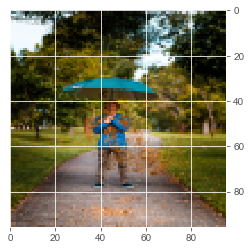

Showing 2085 index image, It is 1.0


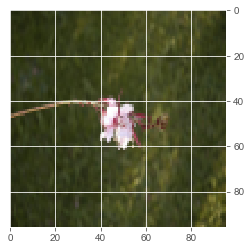

Showing 680 index image, It is 1.0


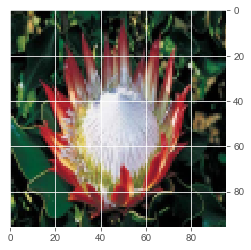

Showing 1821 index image, It is 1.0


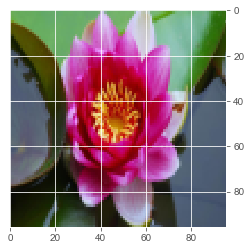

Showing 2238 index image, It is 1.0


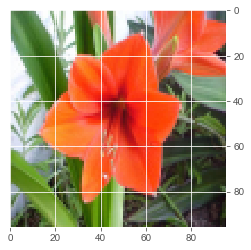

Showing 1100 index image, It is 1.0


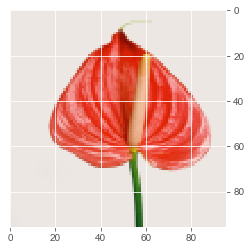

Showing 1284 index image, It is 1.0


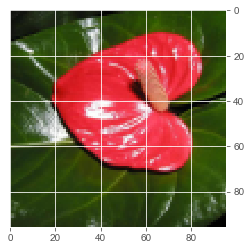

Showing 2756 index image, It is 0.0


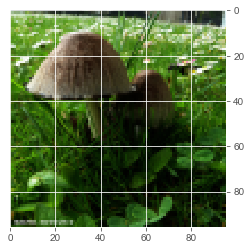

Showing 68 index image, It is 1.0


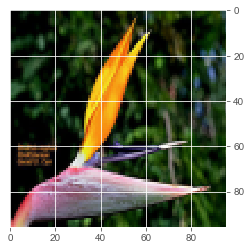

Showing 2090 index image, It is 1.0


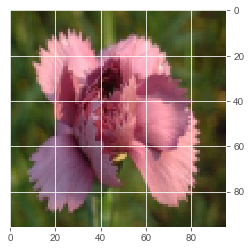

Showing 3606 index image, It is 0.0


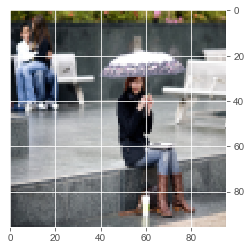

Showing 434 index image, It is 1.0


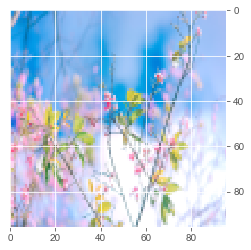

Showing 3275 index image, It is 0.0


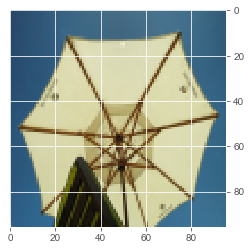

Showing 1308 index image, It is 1.0


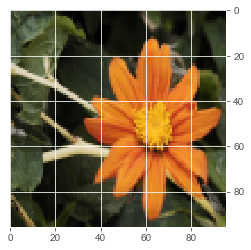

Showing 252 index image, It is 1.0


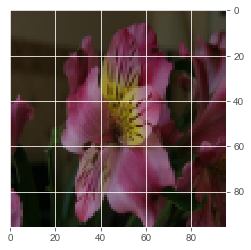

Showing 1686 index image, It is 1.0


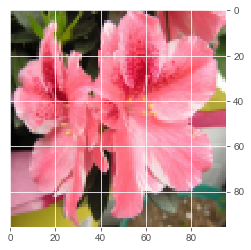

Showing 373 index image, It is 1.0


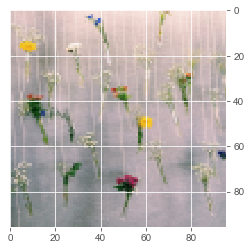

Showing 872 index image, It is 1.0


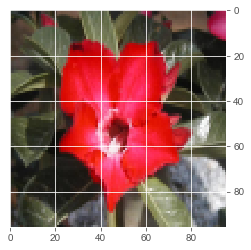

Showing 433 index image, It is 1.0


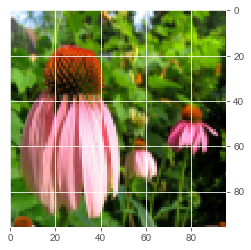

Showing 2452 index image, It is 0.0


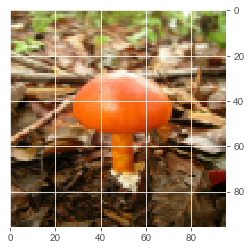

In [0]:
# Randomly show 10 examples of the images

data = tsDatOrg
label = tsLblOrg

for i in range(20):
    index = random.randint(0, len(data)-1)
    print("Showing %s index image, It is %s" %(index, label[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [0]:
# Convert the data into 'float32'
# Rescale the values from 0~255 to 0~1
trDat       = trDatOrg.astype('float32')/255
tsDat       = tsDatOrg.astype('float32')/255

# Retrieve the row size of each image
# Retrieve the column size of each image
imgrows     = trDat.shape[1]
imgclms     = trDat.shape[2]
channel     = 3

# # reshape the data to be [samples][width][height][channel]
# # This is required by Keras framework
# trDat       = trDat.reshape(trDat.shape[0], imgrows, imgclms, channel)
# tsDat       = tsDat.reshape(tsDat.shape[0], imgrows, imgclms, channel)

# Perform one hot encoding on the labels
# Retrieve the number of classes in this problem
trLbl       = to_categorical(trLblOrg)
tsLbl       = to_categorical(tsLblOrg)
num_classes = tsLbl.shape[1]

In [0]:
# fix random seed for reproducibility
seed = 29
np.random.seed(seed)


modelname = 'FlowerPower'

#optmz = optimizers.Adam(lr=0.001)
optmz = optimizers.RMSprop(lr=0.001)

# Baseline Model

In [0]:
# Baseline Model -> func: createBaselineModel()

def createBaselineModel():
    inputs = Input(shape=(imgrows, imgclms, channel))
    x = Conv2D(30, (4, 4), activation='relu')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(50, (4, 4), activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs=[inputs],outputs=x)
    
    model.compile(loss='categorical_crossentropy', 
                  optimizer='adam',
                  metrics=['accuracy'])
    return model

# CNN Base Models

## Base Model Neural Network

In [0]:
import glob
import math
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os, PIL
from PIL import Image
import cv2
import random

import keras
import tensorflow as tf
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import add, concatenate, Conv2D, Dense, Dropout, Flatten, Input
from tensorflow.keras.layers import Activation, AveragePooling2D, BatchNormalization, MaxPooling2D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical

from keras import losses
from sklearn.utils import shuffle

from sklearn.model_selection import train_test_split,cross_val_score, GridSearchCV,RandomizedSearchCV

import sklearn.metrics as metrics

from __future__ import print_function
print(tf.VERSION)
print(tf.keras.__version__)

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')
root_path = 'gdrive/My Drive/Colab Notebooks/'  #change dir to your project folder

In [0]:
trDatOrg       = np.load(root_path + 'Flower_Power/flrnonflr-train-imgs224-0.8.npz')['arr_0']
trLblOrg       = np.load(root_path + 'Flower_Power/flrnonflr-train-labels224-0.8.npz')['arr_0']
tsDatOrg       = np.load(root_path + 'Flower_Power/flrnonflr-test-imgs224-0.8.npz')['arr_0']
tsLblOrg       = np.load(root_path + 'Flower_Power/flrnonflr-test-labels224-0.8.npz')['arr_0']

print("For the training and test datasets:")
print("The shapes are %s, %s, %s, %s" \
      %(trDatOrg.shape, trLblOrg.shape, tsDatOrg.shape, tsLblOrg.shape))

In [0]:
# Randomly show 5 examples of the images

data = tsDatOrg
label = tsLblOrg

for i in range(5):
    index = random.randint(0, len(data)-1)
    print("Showing %s index image, It is %s" %(index, label[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [0]:
# Convert the data into 'float32'
# Rescale the values from 0~255 to 0~1
trDat  = trDatOrg.reshape(4264, 150528)
tsDat = tsDatOrg.reshape(1067, 150528)

trDat  = trDat.astype('float32')
tsDat  = tsDat.astype('float32')

trDat /= 255
tsDat /= 255


# Perform one hot encoding on the labels
# Retrieve the number of classes in this problem
trLbl       = to_categorical(trLblOrg,2)
tsLbl       = to_categorical(tsLblOrg,2)

In [0]:
# X_train forms the test images, and y_test forms the test labels
X_train, y_train, X_test,y_test = trDat, trLbl,tsDat,tsLbl

### Define Model

In [0]:
model = Sequential()
model.add(Dense(128, kernel_initializer='uniform',activation='relu', input_shape=X_train.shape[1:])) 
model.add(Dense(64, kernel_initializer='uniform',activation='relu'))
model.add(Dense(num_classes, kernel_initializer='uniform', activation='softmax'))
  
model = createBaseModel()

model.summary()

### Training the Model

I train the model with batch size of 64 and 20 epochs on both training and validation data.

In [0]:
# Fit the model
# This is where the training starts
history = model.fit(X_train, y_train,
          batch_size=64,
          epochs=20,
          verbose=1)

In [0]:
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

In [0]:
# Make classification on the test dataset
predicts    = model.predict(X_test)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(y_test,axis=1)

# the labels for the classfication report
labelname   = ['flower', 'non-flower']


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

In [0]:
#show shape
trDat_reshape  = trDatOrg.reshape(4264, 150528)
print(trDat_reshape)

### Hyperparameter Tuning with SGD

In [0]:
epochs=60
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd =tf.keras.optimizers.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=True)

In [0]:
model_sgd = Sequential()
model_sgd.add(Dense(128, activation=tf.nn.relu, kernel_initializer='uniform', input_shape=X_train.shape[1:])) 
model_sgd.add(Dense(64, activation=tf.nn.relu, kernel_initializer='uniform'))
model_sgd.add(Dropout(0.1))
model_sgd.add(BatchNormalization())
model_sgd.add(Dense(num_classes, kernel_initializer='uniform', activation=tf.nn.softmax))

model_sgd.summary()

# compile the model
model_sgd.compile(loss='mean_squared_error', 
                  optimizer=sgd, 
                  metrics=['acc'])

In [0]:
# Fit the model
batch_size = 64

history1 = model1.fit(X_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_data=(X_test, y_test))

In [0]:
# Plot the loss function
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(history1.history['loss']), 'r', label='train')
ax.plot(np.sqrt(history1.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Loss', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

# Plot the accuracy
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(history1.history['acc']), 'r', label='train')
ax.plot(np.sqrt(history1.history['val_acc']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'Accuracy', fontsize=20)
ax.legend()
ax.tick_params(labelsize=20)

In [0]:
score_sgd = model_sgd.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score_sgd[0])
print('Test accuracy:', score_sgd[1])

### Learning Rate Adjustment

In [0]:
epochs = 50
learning_rate = 0.01 # initial learning rate
decay_rate = 0.1
momentum = 0.9

# define the optimizer function
sgd =  tf.keras.optimizers.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)

input_dim = X_train.shape[1]
num_classes = 2
batch_size = 64

# build the model
exponential_decay_model = Sequential()
exponential_decay_model.add(Dense(64, activation=tf.nn.relu, kernel_initializer='uniform', input_dim = input_dim))
exponential_decay_model.add(Dropout(0.1))
exponential_decay_model.add(Dense(64, kernel_initializer='uniform', activation=tf.nn.relu))
exponential_decay_model.add(Dense(num_classes, kernel_initializer='uniform', activation=tf.nn.softmax))

# compile the model
exponential_decay_model.compile(loss='categorical_crossentropy', 
                                optimizer=sgd, 
                                metrics=['acc'])
                                
# define the learning rate change 
def exp_decay(epoch):
    lrate = learning_rate * np.exp(-decay_rate*epoch)
    return lrate
    
# learning schedule callback
loss_history = History()
lr_rate = LearningRateScheduler(exp_decay)
callbacks_list = [loss_history, lr_rate]

# you invoke the LearningRateScheduler during the .fit() phase
exponential_decay_model_history = exponential_decay_model.fit(X_train, y_train,
                                    batch_size=batch_size,
                                    epochs=epochs,
                                    callbacks=callbacks_list,
                                    verbose=1,
                                    validation_data=(X_test, y_test))

Better Results :run with learning rate = 0.5 & momentum = 0.8

In [0]:
score_decay = exponential_decay_model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score_decay[0])
print('Test accuracy:', score_decay[1])

Better Results: run with learning rate = 0.01 & momentum = 0.8

In [0]:
score_decay = exponential_decay_model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score_decay[0])
print('Test accuracy:', score_decay[1])

## Base Model - CNN with 1 Convolutional Layer

In [0]:
trDatOrg       = np.load(root_path + 'Flower_Power/flrnonflr-train-imgs224-0.8.npz')['arr_0']
trLblOrg       = np.load(root_path + 'Flower_Power/flrnonflr-train-labels224-0.8.npz')['arr_0']
tsDatOrg       = np.load(root_path + 'Flower_Power/flrnonflr-test-imgs224-0.8.npz')['arr_0']
tsLblOrg       = np.load(root_path + 'Flower_Power/flrnonflr-test-labels224-0.8.npz')['arr_0']

print("For the training and test datasets:")
print("The shapes are %s, %s, %s, %s" \
      %(trDatOrg.shape, trLblOrg.shape, tsDatOrg.shape, tsLblOrg.shape))

In [0]:
# Randomly show 5 examples of the images

data = tsDatOrg
label = tsLblOrg

for i in range(5):
    index = random.randint(0, len(data)-1)
    print("Showing %s index image, It is %s" %(index, label[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [0]:
# Convert the data into 'float32'
# Rescale the values from 0~255 to 0~1
trDat       = trDatOrg.astype('float32')/255
tsDat       = tsDatOrg.astype('float32')/255

# Retrieve the row size of each image
# Retrieve the column size of each image
imgrows     = trDat.shape[1]
imgclms     = trDat.shape[2]
channel     = 3

# Perform one hot encoding on the labels
# Retrieve the number of classes in this problem
trLbl       = to_categorical(trLblOrg,2)
tsLbl       = to_categorical(tsLblOrg,2)
num_classes = tsLbl.shape[1]

In [0]:
# X_train forms the test images, and y_test forms the test labels
X_train, y_train = trDat, trLbl
X_test,y_test = tsDat,tsLbl 

### Define Model

The 1st layer is a Conv2D layer for the convolution operation that extracts features from the input images by sliding a convolution filter over the input to produce a feature map. Here I choose feature map with size 3 x 3.

The 2nd layer is a MaxPooling2D layer for the max-pooling operation that reduces the dimensionality of each feature, which helps shorten training time and reduce number of parameters. Here I choose the pooling window with size 2 x 2.

The next step is to feed the last output tensor into a stack of Dense layers, otherwise known as fully-connected layers. These densely connected classifiers process vectors, which are 1D, whereas the current output is a 3D tensor. Thus, I need to flatten the 3D outputs to 1D, and then add 2 Dense layers on top.

I do a 2-way classification (as there are flowers and non-flowers), using a final layer with 2 outputs and a softmax activation. Softmax activation enables me to calculate the output based on the probabilities. Each class is assigned a probability and the class with the maximum probability is the model’s output for the input.

In [0]:
def createBaseModel():
  inputs = Input(shape=(imgrows, imgclms, channel))
  x = Conv2D(32, (3, 3), padding='same', activation='relu',input_shape=(784,))
  x = MaxPooling2D(pool_size=(2, 2))(x)
  
  x = Flatten()(x)
  
  x = Dense(128, activation='relu')(x)
  x = Dense(num_classes, activation='softmax')(x)
  
  model = Model(inputs=[inputs],outputs=x)
  
  model.compile(loss='categorical_crossentropy', 
                 optimizer='adam',
                  metrics=['accuracy'])
  
  return model
  
model = createBaseModel()
modelGo = createBaseModel()

model.summary()

### Training the Model

I train the model with batch size of 64 and 20 epochs on both training and validation data.

In [0]:
# Fit the model
# This is where the training starts
history = model.fit(X_train, y_train,
          batch_size=64,
          epochs=20,
          verbose=1)

In [0]:
score = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

In [0]:
# Make classification on the test dataset
predicts    = model.predict(X_test)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(y_test,axis=1)

# the labels for the classfication report
labelname   = ['flower', 'non-flower']


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

### Data Augmentation

This section tests the usefulness of data augmentation in reducing overfitting.

Data augmentation takes the approach of generating more training data from existing training samples, by augmenting the samples via a number of random transformations that yield believable-looking images. The goal is that at training time, the model will never see the exact same picture twice. This helps expose the model to more aspects of the data and generalize better.

In Keras, this can be done by configuring a number of random transformations to be performed on the images read by the ImageDataGenerator instance.

rotation_range is a value in degrees (0–180), a range within which to randomly rotate pictures.

width_shift and height_shift are ranges (as a fraction of total width or height) within which to randomly translate pictures vertically or horizontally.

shear_range is for randomly applying shearing transformations.

zoom_range is for randomly zooming inside pictures.

In [0]:
from keras.preprocessing.image import ImageDataGenerator

gen = ImageDataGenerator(rotation_range=8, width_shift_range=0.08, shear_range=0.3,
                               height_shift_range=0.08, zoom_range=0.08)

batches = gen.flow(X_train, y_train, batch_size=64)

In [0]:
history1 = model.fit_generator(batches, steps_per_epoch=3411//64, epochs=20,use_multiprocessing=True)

In [0]:
score1 = model.evaluate(X_test, y_test, verbose=0)
print('Test loss:', score1[0])
print('Test accuracy:', score1[1])

In [0]:
# Make classification on the test dataset
predicts    = model.predict(X_test)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(y_test,axis=1)

# the labels for the classfication report
labelname   = ['flower', 'non-flower']


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

In [0]:
#plot graphs to interpret the results (before data augmentation)

accuracy_org = history.history['acc']
loss_org = history.history['loss']
epochs_org = range(len(accuracy_org))

plt.plot(epochs_org, accuracy_org, 'bo', label='Training accuracy (before data augmentation)')
plt.plot(epochs_org1, accuracy_org1, 'b', label='Training accuracy (after data augmentation)')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

In [0]:
accuracy_org1 = history1.history['acc']
loss_org1 = history1.history['loss']
epochs_org1= range(len(accuracy_org1))

plt.plot(epochs_org, loss_org, 'bo', label='Training loss (before data augmentation)')
plt.plot(epochs_org1, loss_org1, 'b', label='Training loss (after data augmentation)')
plt.title('Training and validation loss')
plt.legend()
plt.figure()

# AlexNet

## Load Data

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
trDatOrg       = np.load('./flrnonflr-train-imgs224-0.8.npz')['arr_0']
trLblOrg       = np.load('./flrnonflr-train-labels224-0.8.npz')['arr_0']
tsDatOrg       = np.load('./flrnonflr-test-imgs224-0.8.npz')['arr_0']
tsLblOrg       = np.load('./flrnonflr-test-labels224-0.8.npz')['arr_0']

print("For the training and test datasets:")
print("The shapes are %s, %s, %s, %s" \
      %(trDatOrg.shape, trLblOrg.shape, tsDatOrg.shape, tsLblOrg.shape))

For the training and test datasets:
The shapes are (4264, 224, 224, 3), (4264,), (1067, 224, 224, 3), (1067,)


Showing 439 index image, It is 1.0


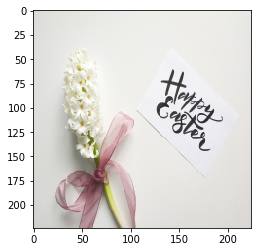

Showing 672 index image, It is 0.0


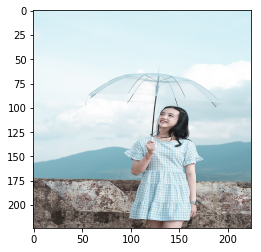

Showing 325 index image, It is 1.0


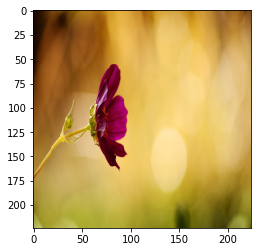

Showing 703 index image, It is 0.0


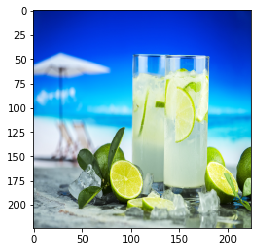

Showing 506 index image, It is 1.0


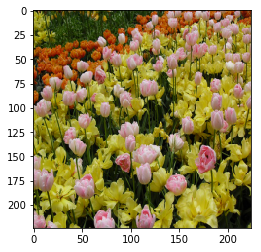

In [0]:
# Randomly show 5 examples of the images

data = tsDatOrg
label = tsLblOrg

for i in range(5):
    index = random.randint(0, len(data)-1)
    print("Showing %s index image, It is %s" %(index, label[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [0]:
# Convert the data into 'float32'
# Rescale the values from 0~255 to 0~1
trDat       = trDatOrg.astype('float32')/255
tsDat       = tsDatOrg.astype('float32')/255

# Retrieve the row size of each image
# Retrieve the column size of each image
imgrows     = trDat.shape[1]
imgclms     = trDat.shape[2]
channel     = 3

# # reshape the data to be [samples][width][height][channel]
# # This is required by Keras framework
# trDat       = trDat.reshape(trDat.shape[0], imgrows, imgclms, channel)
# tsDat       = tsDat.reshape(tsDat.shape[0], imgrows, imgclms, channel)

# Perform one hot encoding on the labels
# Retrieve the number of classes in this problem
trLbl       = to_categorical(trLblOrg)
tsLbl       = to_categorical(tsLblOrg)
num_classes = tsLbl.shape[1]

## Define Model

In [0]:
# fix random seed for reproducibility
seed = 29
np.random.seed(seed)

modelname = 'FlowerPower_AlexNet'
optmz     = optimizers.RMSprop(lr=0.0001)

def lrSchedule(epoch):
    lr  = 1e-3
        
    if epoch > 110:
        lr  *= 1e-3
        
    elif epoch > 100:
        lr  *= 1e-2
        
    elif epoch > 80:
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

LRScheduler     = LearningRateScheduler(lrSchedule)
  
def createAlexNetModel():
    inputs = Input(shape=(imgrows, imgclms, channel))
    x = Conv2D(96, (11, 11), padding='same', strides=(4,4))(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3) ,strides=2)(x)
    x = Conv2D(256, (5, 5), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3) ,strides=2)(x)
    x = Conv2D(384, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(384, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(256, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(3, 3) ,strides=2)(x)
    x = Flatten()(x)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs=[inputs],outputs=x)
    
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optmz,
                  metrics=['accuracy'])
    return model

model = createAlexNetModel()
modelGo = createAlexNetModel()

model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 56, 56, 96)        34944     
_________________________________________________________________
batch_normalization_10 (Batc (None, 56, 56, 96)        384       
_________________________________________________________________
activation_10 (Activation)   (None, 56, 56, 96)        0         
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 27, 27, 96)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 27, 27, 256)       614656    
_________________________________________________________________
batch_normalization_11 (Batc (None, 27, 27, 256)       1024

In [0]:
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
#                                  monitor='val_acc', 
                                  monitor='val_loss',
                                  verbose=0, 
                                  save_best_only=True, 
#                                  mode='max')
                                  mode='min')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')
callbacks_list  = [checkpoint, csv_logger, LRScheduler]
# callbacks_list  = [checkpoint, csv_logger]

In [0]:
# Fit the model
# This is where the training starts
# model.fit(trDat, 
#           trLbl, 
#           validation_data=(tsDat, tsLbl), 
#           epochs=120, 
#           batch_size=16,
#           callbacks=callbacks_list)

datagen = ImageDataGenerator(width_shift_range=0.1,
                             height_shift_range=0.1,
                             rotation_range=30,
                             horizontal_flip=True,
                             vertical_flip=False)

model.fit_generator(datagen.flow(trDat, trLbl, batch_size=32),
                    validation_data=(tsDat, tsLbl),
                    epochs=120, 
                    verbose=1,
                    steps_per_epoch=len(trDat)/32,
                    callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/5
134/133 [==============================] - 57s 428ms/step - loss: 12.5743 - acc: 0.5439 - val_loss: 0.6682 - val_acc: 0.5483
Learning rate:  0.001
Epoch 2/5
134/133 [==============================] - 51s 378ms/step - loss: 0.7240 - acc: 0.6954 - val_loss: 2.6459 - val_acc: 0.5886
Learning rate:  0.001
Epoch 3/5
134/133 [==============================] - 52s 386ms/step - loss: 0.6341 - acc: 0.7498 - val_loss: 9.3927 - val_acc: 0.5745
Learning rate:  0.001
Epoch 4/5
134/133 [==============================] - 54s 403ms/step - loss: 0.5799 - acc: 0.7774 - val_loss: 0.6341 - val_acc: 0.6036
Learning rate:  0.001
Epoch 5/5
134/133 [==============================] - 54s 403ms/step - loss: 0.5264 - acc: 0.7922 - val_loss: 0.4669 - val_acc: 0.8172


In [0]:
## Now the training is complete, we get
# another object to load the weights
# compile it, so that we can do 
# final evaluation on it
modelGo.load_weights(filepath)
modelGo.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])

In [0]:
# Make classification on the test dataset
predicts    = modelGo.predict(tsDat)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['flower', 'non-flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 81.72%
              precision    recall  f1-score   support

      flower     0.7342    0.8943    0.8064       454
  non-flower     0.9066    0.7602    0.8270       613

    accuracy                         0.8172      1067
   macro avg     0.8204    0.8272    0.8167      1067
weighted avg     0.8332    0.8172    0.8182      1067

[[406  48]
 [147 466]]


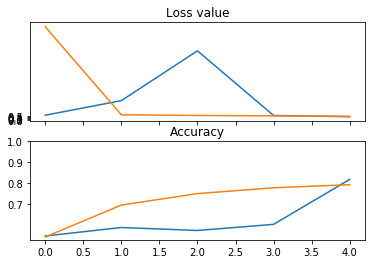

In [0]:
import pandas as pd

records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0, 0.20, 0.30, 0.4, 0.5])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records['val_acc'])
plt.plot(records['acc'])
plt.yticks([0.7, 0.8, 0.9, 1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

In [0]:
wrong_ans_index = []

for i in range(len(predout)):
    if predout[i] != testout[i]:
        wrong_ans_index.append(i)

In [0]:
wrong_ans_index = list(set(wrong_ans_index))

Showing 918 index image
Predicted as 1 but is actually 0


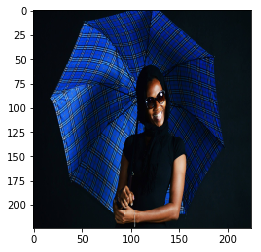

Showing 923 index image
Predicted as 1 but is actually 0


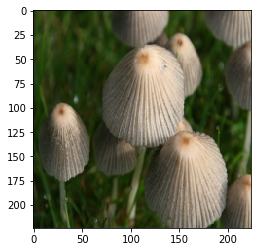

Showing 558 index image
Predicted as 0 but is actually 1


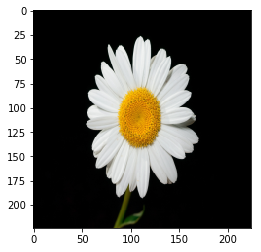

Showing 566 index image
Predicted as 0 but is actually 1


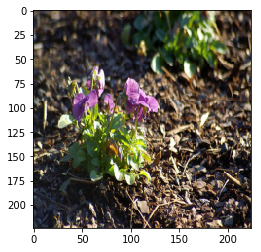

Showing 936 index image
Predicted as 1 but is actually 0


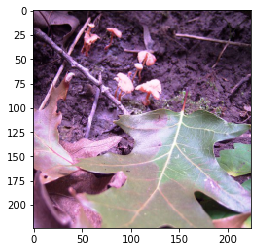

Showing 238 index image
Predicted as 0 but is actually 1


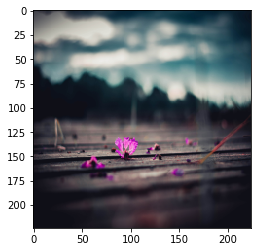

Showing 247 index image
Predicted as 0 but is actually 1


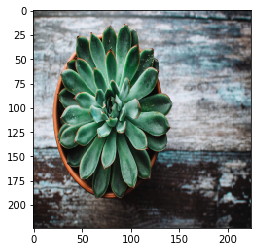

Showing 79 index image
Predicted as 0 but is actually 1


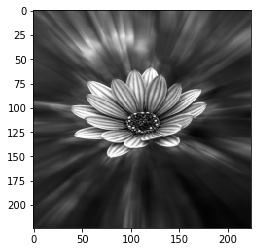

Showing 1008 index image
Predicted as 1 but is actually 0


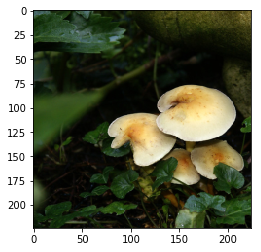

Showing 211 index image
Predicted as 0 but is actually 1


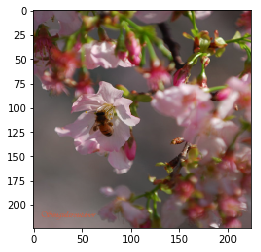

In [0]:
# Randomly show X examples of that was wrong

dataset = tsDatOrg #flowers #fungus #rocks

for index in range(10):
    index = wrong_ans_index[random.randint(0, len(wrong_ans_index)-1)]
    print("Showing %s index image" %(index))
    print("Predicted as %s but is actually %s" %(predout[index], testout[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

# VGG

## Load Data

In [0]:
trDatOrg       = np.load('./flrnonflr-train-imgs224-0.8.npz')['arr_0']
trLblOrg       = np.load('./flrnonflr-train-labels224-0.8.npz')['arr_0']
tsDatOrg       = np.load('./flrnonflr-test-imgs224-0.8.npz')['arr_0']
tsLblOrg       = np.load('./flrnonflr-test-labels224-0.8.npz')['arr_0']

print("For the training and test datasets:")
print("The shapes are %s, %s, %s, %s" \
      %(trDatOrg.shape, trLblOrg.shape, tsDatOrg.shape, tsLblOrg.shape))

For the training and test datasets:
The shapes are (4264, 224, 224, 3), (4264,), (1067, 224, 224, 3), (1067,)


Showing 386 index image, It is 1.0


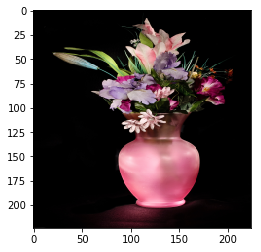

Showing 118 index image, It is 1.0


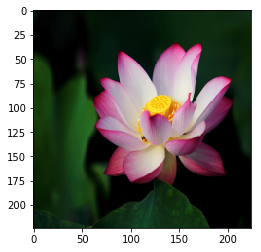

Showing 901 index image, It is 0.0


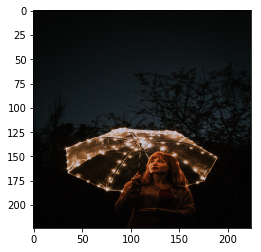

Showing 671 index image, It is 0.0


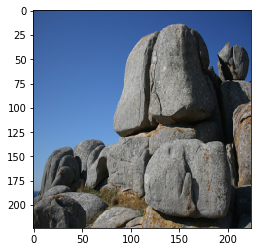

Showing 137 index image, It is 1.0


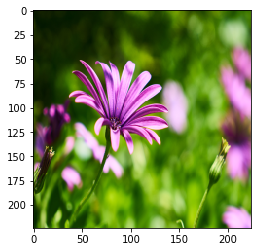

In [0]:
# Randomly show 5 examples of the images

data = tsDatOrg
label = tsLblOrg

for i in range(5):
    index = random.randint(0, len(data)-1)
    print("Showing %s index image, It is %s" %(index, label[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [0]:
# Convert the data into 'float32'
# Rescale the values from 0~255 to 0~1
trDat       = trDatOrg.astype('float32')/255
tsDat       = tsDatOrg.astype('float32')/255

# Retrieve the row size of each image
# Retrieve the column size of each image
imgrows     = trDat.shape[1]
imgclms     = trDat.shape[2]
channel     = 3

# # reshape the data to be [samples][width][height][channel]
# # This is required by Keras framework
# trDat       = trDat.reshape(trDat.shape[0], imgrows, imgclms, channel)
# tsDat       = tsDat.reshape(tsDat.shape[0], imgrows, imgclms, channel)

# Perform one hot encoding on the labels
# Retrieve the number of classes in this problem
trLbl       = to_categorical(trLblOrg)
tsLbl       = to_categorical(tsLblOrg)
num_classes = tsLbl.shape[1]

## Define Model

In [0]:
# fix random seed for reproducibility
seed = 29
np.random.seed(seed)

modelname = 'FlowerPower_VGG_Mod3'
optmz     = optimizers.RMSprop(lr=0.0001)
# optmz     = 'adam'

def lrSchedule(epoch):
    lr  = 1e-3
    
    if epoch > 140:
        lr  *= 1e-3
        
    elif epoch > 120:
        lr  *= 1e-2
        
    elif epoch > 90:
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

LRScheduler     = LearningRateScheduler(lrSchedule)
  
def createMod3VGGModel():
    inputs = Input(shape=(imgrows, imgclms, channel))
    x = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(128, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(256, (3, 3), padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Flatten()(x)
    x = Dense(1024, activation='relu', kernel_initializer='he_normal')(x)
    x = Dropout(0.5)(x)
    x = Dense(1024, activation='relu', kernel_initializer='he_normal')(x)
    x = Dropout(0.5)(x)
    x = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs=[inputs],outputs=x)
    
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optmz,
                  metrics=['accuracy'])
    return model

model_mod3 = createMod3VGGModel()
model_mod3.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 224, 224, 64)      1792      
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 64)      256       
_________________________________________________________________
activation (Activation)      (None, 224, 224, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 64)      36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 64)      256       
_________

In [0]:
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath,  
                                  monitor='val_loss',
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='min')

# Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')
callbacks_list  = [checkpoint, csv_logger, LRScheduler]

In [0]:
# Fit the model
# This is where the training starts
# model.fit(trDat, 
#           trLbl, 
#           validation_data=(tsDat, tsLbl), 
#           epochs=120, 
#           batch_size=16,
#           callbacks=callbacks_list)

datagen = ImageDataGenerator(width_shift_range=0.1,
                             height_shift_range=0.1,
                             rotation_range=30,
                             horizontal_flip=True,
                             vertical_flip=False)

model_mod3.fit_generator(datagen.flow(trDat, trLbl, batch_size=32),
                    validation_data=(tsDat, tsLbl),
                    epochs=150, 
                    verbose=1,
                    steps_per_epoch=len(trDat)/32,
                    callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/5
134/133 [==============================] - 157s 1s/step - loss: 55.6145 - acc: 0.5563 - val_loss: 0.7019 - val_acc: 0.5052
Learning rate:  0.001
Epoch 2/5
134/133 [==============================] - 134s 997ms/step - loss: 0.9658 - acc: 0.5591 - val_loss: 2.1811 - val_acc: 0.5342
Learning rate:  0.001
Epoch 3/5
134/133 [==============================] - 133s 994ms/step - loss: 0.7602 - acc: 0.5774 - val_loss: 3.0522 - val_acc: 0.5745
Learning rate:  0.001
Epoch 4/5
134/133 [==============================] - 140s 1s/step - loss: 0.7844 - acc: 0.5673 - val_loss: 0.6730 - val_acc: 0.5745
Learning rate:  0.001
Epoch 5/5
134/133 [==============================] - 134s 1s/step - loss: 0.8533 - acc: 0.5652 - val_loss: 0.7225 - val_acc: 0.5736


In [0]:
## Now the training is complete, we get
# another object to load the weights
# compile it, so that we can do 
# final evaluation on it
model_mod3Go = createMod3VGGModel()
model_mod3Go.load_weights(filepath)
model_mod3Go.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])

In [0]:
# Make classification on the test dataset
predicts    = model_mod3Go.predict(tsDat)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['flower', 'non-flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 57.45%
              precision    recall  f1-score   support

      flower     0.0000    0.0000    0.0000       454
  non-flower     0.5745    1.0000    0.7298       613

    accuracy                         0.5745      1067
   macro avg     0.2873    0.5000    0.3649      1067
weighted avg     0.3301    0.5745    0.4193      1067

[[  0 454]
 [  0 613]]


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


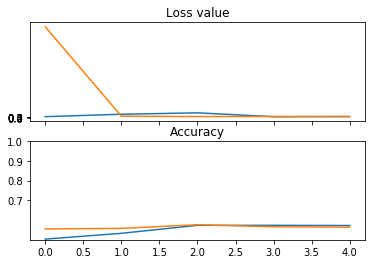

In [0]:
import pandas as pd

records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0, 0.20, 0.30, 0.4, 0.5])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records['val_acc'])
plt.plot(records['acc'])
plt.yticks([0.7, 0.8, 0.9, 1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

In [0]:
wrong_ans_index = []

for i in range(len(predout)):
    if predout[i] != testout[i]:
        wrong_ans_index.append(i)

In [0]:
wrong_ans_index = list(set(wrong_ans_index))

Showing 961 index image
Predicted as 1 but is actually 0


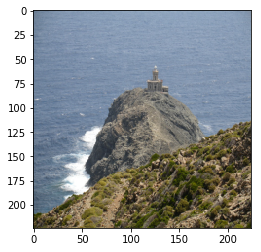

Showing 760 index image
Predicted as 1 but is actually 0


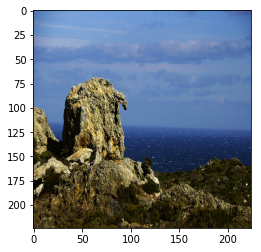

Showing 742 index image
Predicted as 1 but is actually 0


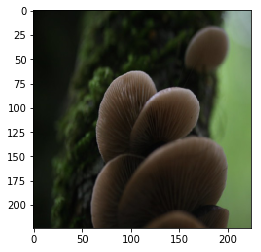

Showing 711 index image
Predicted as 1 but is actually 0


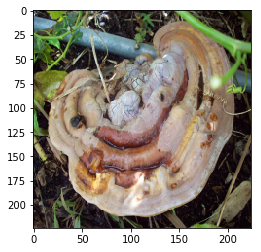

Showing 862 index image
Predicted as 1 but is actually 0


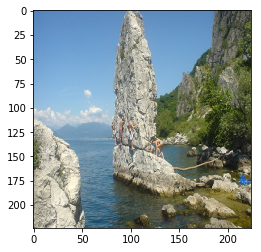

Showing 663 index image
Predicted as 1 but is actually 0


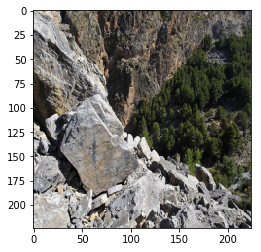

Showing 874 index image
Predicted as 1 but is actually 0


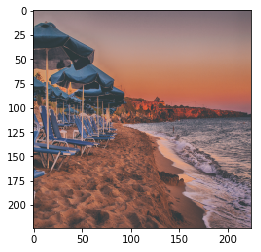

Showing 733 index image
Predicted as 1 but is actually 0


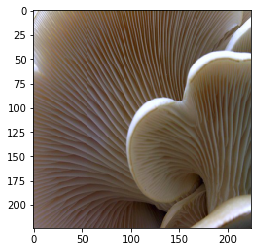

Showing 803 index image
Predicted as 1 but is actually 0


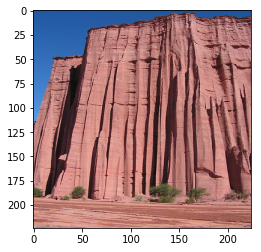

Showing 866 index image
Predicted as 1 but is actually 0


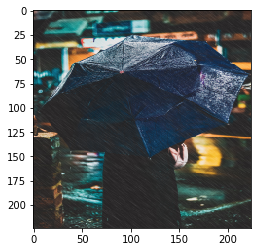

In [0]:
# Randomly show X examples of that was wrong

dataset = tsDatOrg #flowers #fungus #rocks

for index in range(10):
    index = wrong_ans_index[random.randint(0, len(wrong_ans_index)-1)]
    print("Showing %s index image" %(index))
    print("Predicted as %s but is actually %s" %(predout[index], testout[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

# ResNet v1

In [0]:
# ResNetV1 -> func: createResNetV1()
def resLyr(inputs,
           numFilters=16,
           kernelSz=3,
           strides=1,
           activation='relu',
           batchNorm=True,
           convFirst=True,
           lyrName=None):
    convLyr = Conv2D(numFilters, kernel_size=kernelSz, strides=strides, 
                     padding='same', kernel_initializer='he_normal', 
                     kernel_regularizer=l2(1e-4), 
                     name=lyrName+'_conv' if lyrName else None)
    x = inputs
    if convFirst:
        x = convLyr(x)
        if batchNorm:
            x = BatchNormalization(name=lyrName+'_bn' if lyrName else None)(x)
        if activation is not None:
            x = Activation(activation,name=lyrName+'_'+activation if lyrName else None)(x)
    else:
        if batchNorm:
            x = BatchNormalization(name=lyrName+'_bn' if lyrName else None)(x)
        if activation is not None:
            x = Activation(activation, name=lyrName+'_'+activation if lyrName else None)(x)
        x = convLyr(x)
    return x


def resBlkV1(inputs,
             numFilters=16,
             numBlocks=3,
             downsampleOnFirst=True,
             names=None):
    x = inputs
    for run in range(0,numBlocks):
        strides = 1
        blkStr = str(run+1)
        if downsampleOnFirst and run == 0:
            strides = 2
        y = resLyr(inputs=x, numFilters=numFilters, strides=strides,
                   lyrName=names+'_Blk'+blkStr+'_Res1' if names else None)
        y = resLyr(inputs=y, numFilters=numFilters, activation=None,
                   lyrName=names+'_Blk'+blkStr+'_Res2' if names else None)
        if downsampleOnFirst and run == 0:
            x = resLyr(inputs=x, numFilters=numFilters, kernelSz=1,
                       strides=strides, activation=None, batchNorm=False,
                       lyrName=names+'_Blk'+blkStr+'_lin' if names else None)
        x = add([x,y], name=names+'_Blk'+blkStr+'_add' if names else None)
        x = Activation('relu', name=names+'_Blk'+blkStr+'_relu' if names else None)(x)
    return x

def createResNetV1(inputShape=(imgrows, imgclms, channel),
                   numClasses=2):
    inputs = Input(shape=inputShape)
    v = resLyr(inputs, lyrName='Inpt')
    v = resBlkV1(inputs=v, numFilters=16, numBlocks=3,
                 downsampleOnFirst=False, names='Stg1')
    v = Dropout(0.30)(v)
    v = resBlkV1(inputs=v, numFilters=32, numBlocks=3,
                 downsampleOnFirst=True, names='Stg2')
    v = Dropout(0.40)(v)
    v = resBlkV1(inputs=v, numFilters=64, numBlocks=3,
                 downsampleOnFirst=True, names='Stg3')
    v = Dropout(0.50)(v)
    v = resBlkV1(inputs=v, numFilters=128, numBlocks=3,
                 downsampleOnFirst=True, names='Stg4')
    v = Dropout(0.50)(v)
    v = resBlkV1(inputs=v, numFilters=128, numBlocks=3,
                 downsampleOnFirst=False, names='Stg5')
    v = Dropout(0.50)(v)
    v = resBlkV1(inputs=v, numFilters=256, numBlocks=3,
                 downsampleOnFirst=True, names='Stg6')
    v = Dropout(0.50)(v)
    v = AveragePooling2D(pool_size=6, name='AvgPool')(v)
    v = Flatten()(v) 
    outputs = Dense(numClasses, activation='softmax', 
                    kernel_initializer='he_normal')(v)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optmz, 
                  metrics=['accuracy'])
    return model

# Inception v4

In [0]:
# Mostly Original # Inception-v4 -> func: create_inception_v4()

def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_a_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_2)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_2, x_ER1_3])
    return x

def inception_b_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_1)
    x_MR1_3 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_2)
    
    x_ER1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=192, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=224, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_4 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_3)
    x_ER1_5 = Conv2D(filters=256, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_4)

    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_3, x_ER1_5])
    return x

def inception_c_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_1_L2 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_MR1_1)
    x_MR1_1_R2 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=448, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=512, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_3_L1 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_3)
    x_ER1_3_R1 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_3)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_1_L2, x_MR1_1_R2, x_ER1_3_L1, x_ER1_3_R1])
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def reduction_b_block(inputs,
                      names=None):

        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x_M_1)
    
    x_R_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=320, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    x_R_4 = Conv2D(filters=320, kernel_size=(3, 3), strides=2, padding='valid')(x_R_3)
    
    x = concatenate([x_L_1, x_M_2, x_R_4])
    return x

def create_inception_v4(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-v4"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = inception_a_block(x)
    x = inception_a_block(x)
    x = inception_a_block(x)
    x = inception_a_block(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = reduction_b_block(x)
    
    x = inception_c_block(x)
    x = inception_c_block(x)
    x = inception_c_block(x)
    
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1536)(x) # Changed
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [0]:
# Modified2 # Inception-v4 -> func: create_inception_v4()

def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_a_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_2)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_2, x_ER1_3])
    return x

def inception_b_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_1)
    x_MR1_3 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_2)
    
    x_ER1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=192, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=224, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_4 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_3)
    x_ER1_5 = Conv2D(filters=256, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_4)

    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_3, x_ER1_5])
    return x

def inception_c_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_1_L2 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_MR1_1)
    x_MR1_1_R2 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=448, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=512, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_3_L1 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_3)
    x_ER1_3_R1 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_3)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_1_L2, x_MR1_1_R2, x_ER1_3_L1, x_ER1_3_R1])
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def reduction_b_block(inputs,
                      names=None):

        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x_M_1)
    
    x_R_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=320, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    x_R_4 = Conv2D(filters=320, kernel_size=(3, 3), strides=2, padding='valid')(x_R_3)
    
    x = concatenate([x_L_1, x_M_2, x_R_4])
    return x

def create_inception_v4(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-v4"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = reduction_b_block(x)
    
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1536)(x) # Changed
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [0]:
# Modified #(halfed) # Inception-v4 -> func: create_inception_v4()

def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=16, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=16, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=48, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    x_R2_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=32, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=32, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_a_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=48, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=48, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_2)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_2, x_ER1_3])
    return x

def inception_b_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=112, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_1)
    x_MR1_3 = Conv2D(filters=128, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_2)
    
    x_ER1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=96, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=112, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_4 = Conv2D(filters=112, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_3)
    x_ER1_5 = Conv2D(filters=128, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_4)

    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_3, x_ER1_5])
    return x

def inception_c_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_1_L2 = Conv2D(filters=128, kernel_size=(1, 3), strides=1, padding='same')(x_MR1_1)
    x_MR1_1_R2 = Conv2D(filters=128, kernel_size=(3, 1), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=224, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_3_L1 = Conv2D(filters=128, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_3)
    x_ER1_3_R1 = Conv2D(filters=128, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_3)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_1_L2, x_MR1_1_R2, x_ER1_3_L1, x_ER1_3_R1])
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 96, 96, 128, 192
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 128, 128, 192, 192
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def reduction_b_block(inputs,
                      names=None):

        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x_M_1)
    
    x_R_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=128, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=160, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    x_R_4 = Conv2D(filters=160, kernel_size=(3, 3), strides=2, padding='valid')(x_R_3)
    
    x = concatenate([x_L_1, x_M_2, x_R_4])
    return x

def create_inception_v4(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-v4"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = reduction_b_block(x)
    
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(256)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optmz, 
                  metrics=['accuracy'])
    return model 

In [0]:
# Mostly Original # Inception-Res-v2 -> func: create_inception_resnet_v2()
def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_resnet_v2_a_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs
    
    x_L_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_M_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x_M_1)
    
    x_R_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_M_2, x_R_3])
    x_C_2 = Conv2D(filters=384, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_b_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=160, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=192, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=1152, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)

    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_c_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=224, kernel_size=(1, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=2048, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def inception_resnet_v2_reduction_b_block(inputs,
                      names=None):   
    x = inputs
    
    x_EL_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_ML_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ML_2 = Conv2D(filters=384, kernel_size=(3, 3), strides=2, padding='valid')(x_ML_1)
    
    x_MR_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR_2 = Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='valid')(x_MR_1)
    
    x_ER_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER_2 = Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same')(x_ER_1)
    x_ER_3 = Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='valid')(x_ER_2)
    
    x = concatenate([x_EL_1, x_ML_2, x_MR_2, x_ER_3])
    return x

def create_inception_resnet_v2(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-ResNet-v2"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_reduction_b_block(x)
    
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1792)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [0]:
# Modified # Inception-Res-v2 -> func: create_inception_resnet_v2() 1,3,1 & 0.5
def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_resnet_v2_a_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs
    
    x_L_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_M_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x_M_1)
    
    x_R_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_M_2, x_R_3])
    x_C_2 = Conv2D(filters=384, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_b_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=80, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=96, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=672, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)

    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_c_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=114, kernel_size=(1, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=128, kernel_size=(3, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=1120, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 96, 112, 128, 192
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 96, 96, 128, 192
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 128, 128, 96, 192
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def inception_resnet_v2_reduction_b_block(inputs,
                      names=None):   
    x = inputs
    
    x_EL_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_ML_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ML_2 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x_ML_1)
    
    x_MR_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR_2 = Conv2D(filters=128, kernel_size=(3, 3), strides=2, padding='valid')(x_MR_1)
    
    x_ER_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER_2 = Conv2D(filters=128, kernel_size=(3, 3), strides=1, padding='same')(x_ER_1)
    x_ER_3 = Conv2D(filters=128, kernel_size=(3, 3), strides=2, padding='valid')(x_ER_2)
    
    x = concatenate([x_EL_1, x_ML_2, x_MR_2, x_ER_3])
    return x

def create_inception_resnet_v2(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-ResNet-v2"
    inputs = Input(shape=inputShape)
    
    batch_norm = True
    no_a_block = 1
    no_b_block = 3
    no_c_block = 1
    
    x = stem_block(inputs)
    
    for i in range(no_a_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_a_block(x, scale=0.15)
    x = BatchNormalization()(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    for i in range(no_b_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_b_block(x, scale=0.15)
    x = BatchNormalization()(x)
    x = inception_resnet_v2_reduction_b_block(x)
    
    for i in range(no_c_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_c_block(x, scale=0.15)
    x = BatchNormalization()(x)

    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(896)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [0]:
# Modified # SE Inception-Res-v2 -> func: create_se_inception_resnet_v2() 1,3,1 & 0.5
def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_resnet_v2_a_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs
    
    x_L_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_M_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x_M_1)
    
    x_R_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_M_2, x_R_3])
    x_C_2 = Conv2D(filters=384, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_b_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=80, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=96, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=672, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)

    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_c_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=114, kernel_size=(1, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=128, kernel_size=(3, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=1120, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 96, 96, 128, 192
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 128, 128, 96, 192
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def inception_resnet_v2_reduction_b_block(inputs,
                      names=None):   
    x = inputs
    
    x_EL_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_ML_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ML_2 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x_ML_1)
    
    x_MR_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR_2 = Conv2D(filters=128, kernel_size=(3, 3), strides=2, padding='valid')(x_MR_1)
    
    x_ER_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER_2 = Conv2D(filters=128, kernel_size=(3, 3), strides=1, padding='same')(x_ER_1)
    x_ER_3 = Conv2D(filters=128, kernel_size=(3, 3), strides=2, padding='valid')(x_ER_2)
    
    x = concatenate([x_EL_1, x_ML_2, x_MR_2, x_ER_3])
    return x

def squeeze_excitation_layer(inputs, out_dim, ratio, layer_name):

    x = inputs
    
    x = GlobalAveragePooling2D()(x)
    x = Dense(units=out_dim / ratio, use_bias=True)(x)
    x = Activation(activation='relu')(x)
    x = Dense(units=out_dim, use_bias=True)(x)
    x = Activation(activation='sigmoid')(x)

    x = Reshape([1, 1, out_dim])(x)
    
    scale = Lambda(lambda ipt: ipt[0] * ipt[1] ,
                          output_shape=backend.int_shape(x)[1:])([inputs, x])

    return scale
        
def create_se_inception_resnet_v2(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-ResNet-v2"
    inputs = Input(shape=inputShape)
    
    batch_norm = True
    no_a_block = 1
    no_b_block = 3
    no_c_block = 1
    reduction_ratio = 4
    
    x = stem_block(inputs)
    
    for i in range(no_a_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_a_block(x, scale=0.15)
        chnl = int(np.shape(x)[-1])
        x = squeeze_excitation_layer(x, out_dim=chnl, ratio=reduction_ratio, layer_name='SE_A'+str(i))
    x = BatchNormalization()(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    chnl = int(np.shape(x)[-1])
    x = squeeze_excitation_layer(x, out_dim=chnl, ratio=reduction_ratio, layer_name='SE_A')
    
    for i in range(no_b_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_b_block(x, scale=0.15)
        chnl = int(np.shape(x)[-1])
        x = squeeze_excitation_layer(x, out_dim=chnl, ratio=reduction_ratio, layer_name='SE_B'+str(i))
    x = BatchNormalization()(x)
    x = inception_resnet_v2_reduction_b_block(x)
    
    for i in range(no_c_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_c_block(x, scale=0.15)
    x = BatchNormalization()(x)

    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(896)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [0]:
# Setup the models
model       = create_se_inception_resnet_v2() # This is meant for training
modelGo     = create_se_inception_resnet_v2() # This is used for final testing

model.summary()

Instructions for updating:
`normal` is a deprecated alias for `truncated_normal`
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 96, 96, 3)    0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 47, 47, 32)   896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 45, 45, 32)   9248        conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 45, 45, 64)   18496       conv2d_1[0][0]                   
____________________________

In [0]:
continue_training = True

if continue_training == True:
    best_model_filepath = "FlowerPower_SEInceptionResNetV2best9429.hdf5"
    model.load_weights(best_model_filepath)

In [0]:
# Create checkpoint for the training
# This checkpoint performs model saving when
# an epoch gives highest testing accuracy
# filepath        = modelname + ".hdf5"
# checkpoint      = ModelCheckpoint(filepath, 
#                                   monitor='val_acc', 
#                                   verbose=0, 
#                                   save_best_only=True, 
#                                   mode='max')

#                             # Log the epoch detail into csv
# csv_logger      = CSVLogger(modelname +'.csv')
# callbacks_list  = [checkpoint, csv_logger]

def lrSchedule(epoch):
    lr  = 1e-3
    
    if epoch > 270: #190
        lr  *= 0.5e-3
        
    elif epoch > 240: #160
        lr  *= 1e-3
        
    elif epoch > 200: #140
        lr  *= 1e-2
        
    elif epoch > 150: #100
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

LRScheduler     = LearningRateScheduler(lrSchedule)

                            # Create checkpoint for the training
                            # This checkpoint performs model saving when
                            # an epoch gives highest testing accuracy
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
                                  monitor='val_acc', 
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='max')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')
callbacks_list  = [checkpoint, csv_logger, LRScheduler]

In [0]:
# Fit the model
# This is where the training starts
# model.fit(trDat, 
#           trLbl, 
#           validation_data=(tsDat, tsLbl), 
#           epochs=60, 
#           batch_size=32,
#           callbacks=callbacks_list)

datagen = ImageDataGenerator(width_shift_range=0.25,
                             height_shift_range=0.25,
                             rotation_range=45,
                             zoom_range=0.8,
                             #zca_epsilon=1e-6,
                             #zca_whitening=True,
                             fill_mode='nearest',
                             horizontal_flip=True,
                             vertical_flip=False)

model.fit_generator(datagen.flow(trDat, trLbl, batch_size=16),
                    validation_data=(tsDat, tsLbl),
                    epochs=300, #300 
                    verbose=1,
                    steps_per_epoch=len(trDat)/16,
                    callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/300
924/924 [==============================] - 98s 106ms/step - loss: 0.2210 - acc: 0.9166 - val_loss: 0.1885 - val_acc: 0.9267
Learning rate:  0.001
Epoch 2/300
924/924 [==============================] - 73s 79ms/step - loss: 0.2528 - acc: 0.8994 - val_loss: 0.1855 - val_acc: 0.9307
Learning rate:  0.001
Epoch 3/300
924/924 [==============================] - 76s 83ms/step - loss: 0.2298 - acc: 0.9117 - val_loss: 0.1742 - val_acc: 0.9334
Learning rate:  0.001
Epoch 4/300
924/924 [==============================] - 72s 77ms/step - loss: 0.2252 - acc: 0.9141 - val_loss: 0.1667 - val_acc: 0.9391
Learning rate:  0.001
Epoch 5/300
924/924 [==============================] - 72s 78ms/step - loss: 0.2163 - acc: 0.9153 - val_loss: 0.1678 - val_acc: 0.9340
Learning rate:  0.001
Epoch 6/300
924/924 [==============================] - 71s 77ms/step - loss: 0.2162 - acc: 0.9189 - val_loss: 0.1988 - val_acc: 0.9242
Learning rate:  0.001
Epoch 7/300
924/924 [==============

Learning rate:  0.001
Epoch 53/300
924/924 [==============================] - 71s 76ms/step - loss: 0.2167 - acc: 0.9174 - val_loss: 0.1659 - val_acc: 0.9397
Learning rate:  0.001
Epoch 54/300
924/924 [==============================] - 72s 78ms/step - loss: 0.2142 - acc: 0.9184 - val_loss: 0.1669 - val_acc: 0.9353
Learning rate:  0.001
Epoch 55/300
924/924 [==============================] - 71s 76ms/step - loss: 0.2134 - acc: 0.9185 - val_loss: 0.1880 - val_acc: 0.9351
Learning rate:  0.001
Epoch 56/300
924/924 [==============================] - 76s 82ms/step - loss: 0.2062 - acc: 0.9198 - val_loss: 0.1901 - val_acc: 0.9337
Learning rate:  0.001
Epoch 57/300
924/924 [==============================] - 72s 78ms/step - loss: 0.2119 - acc: 0.9185 - val_loss: 0.1807 - val_acc: 0.9351
Learning rate:  0.001
Epoch 58/300
924/924 [==============================] - 74s 80ms/step - loss: 0.2135 - acc: 0.9170 - val_loss: 0.1604 - val_acc: 0.9391
Learning rate:  0.001
Epoch 59/300
924/924 [========

Learning rate:  0.001
Epoch 105/300
924/924 [==============================] - 70s 76ms/step - loss: 0.2053 - acc: 0.9205 - val_loss: 0.1530 - val_acc: 0.9424
Learning rate:  0.001
Epoch 106/300
924/924 [==============================] - 71s 77ms/step - loss: 0.2048 - acc: 0.9216 - val_loss: 0.1707 - val_acc: 0.9386
Learning rate:  0.001
Epoch 107/300
924/924 [==============================] - 75s 81ms/step - loss: 0.2102 - acc: 0.9202 - val_loss: 0.1661 - val_acc: 0.9391
Learning rate:  0.001
Epoch 108/300
924/924 [==============================] - 74s 80ms/step - loss: 0.2099 - acc: 0.9169 - val_loss: 0.1684 - val_acc: 0.9367
Learning rate:  0.001
Epoch 109/300
924/924 [==============================] - 74s 80ms/step - loss: 0.2083 - acc: 0.9194 - val_loss: 0.1672 - val_acc: 0.9386
Learning rate:  0.001
Epoch 110/300
924/924 [==============================] - 75s 82ms/step - loss: 0.2063 - acc: 0.9209 - val_loss: 0.1622 - val_acc: 0.9345
Learning rate:  0.001
Epoch 111/300
924/924 [=

924/924 [==============================] - 73s 79ms/step - loss: 0.1797 - acc: 0.9335 - val_loss: 0.1402 - val_acc: 0.9456
Learning rate:  1e-05
Epoch 208/300
924/924 [==============================] - 71s 77ms/step - loss: 0.1683 - acc: 0.9364 - val_loss: 0.1390 - val_acc: 0.9470
Learning rate:  1e-05
Epoch 209/300
924/924 [==============================] - 70s 76ms/step - loss: 0.1812 - acc: 0.9328 - val_loss: 0.1446 - val_acc: 0.9462
Learning rate:  1e-05
Epoch 210/300
924/924 [==============================] - 74s 80ms/step - loss: 0.1810 - acc: 0.9315 - val_loss: 0.1400 - val_acc: 0.9470
Learning rate:  1e-05
Epoch 211/300
924/924 [==============================] - 72s 78ms/step - loss: 0.1744 - acc: 0.9341 - val_loss: 0.1406 - val_acc: 0.9472
Learning rate:  1e-05
Epoch 212/300
924/924 [==============================] - 73s 79ms/step - loss: 0.1771 - acc: 0.9330 - val_loss: 0.1402 - val_acc: 0.9453
Learning rate:  1e-05
Epoch 213/300
924/924 [==============================] - 74s

Learning rate:  1e-06
Epoch 259/300
924/924 [==============================] - 71s 77ms/step - loss: 0.1760 - acc: 0.9349 - val_loss: 0.1378 - val_acc: 0.9464
Learning rate:  1e-06
Epoch 260/300
924/924 [==============================] - 73s 79ms/step - loss: 0.1711 - acc: 0.9336 - val_loss: 0.1385 - val_acc: 0.9464
Learning rate:  1e-06
Epoch 261/300
924/924 [==============================] - 71s 77ms/step - loss: 0.1780 - acc: 0.9313 - val_loss: 0.1386 - val_acc: 0.9470
Learning rate:  1e-06
Epoch 262/300
924/924 [==============================] - 70s 76ms/step - loss: 0.1784 - acc: 0.9318 - val_loss: 0.1385 - val_acc: 0.9456
Learning rate:  1e-06
Epoch 263/300
924/924 [==============================] - 71s 77ms/step - loss: 0.1712 - acc: 0.9350 - val_loss: 0.1471 - val_acc: 0.9462
Learning rate:  1e-06
Epoch 264/300
924/924 [==============================] - 73s 79ms/step - loss: 0.1745 - acc: 0.9358 - val_loss: 0.1438 - val_acc: 0.9456
Learning rate:  1e-06
Epoch 265/300
924/924 [=

In [0]:
##### Now the training is complete, we get
# another object to load the weights
# compile it, so that we can do 
# final evaluation on it
modelGo.load_weights(filepath)
modelGo.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])

In [0]:
# Make classification on the test dataset
predicts    = modelGo.predict(tsDat)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['non-flower', 'flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 94.89%
              precision    recall  f1-score   support

  non-flower     0.9296    0.9405    0.9350      1446
      flower     0.9615    0.9542    0.9578      2250

    accuracy                         0.9489      3696
   macro avg     0.9455    0.9474    0.9464      3696
weighted avg     0.9490    0.9489    0.9489      3696

[[1360   86]
 [ 103 2147]]


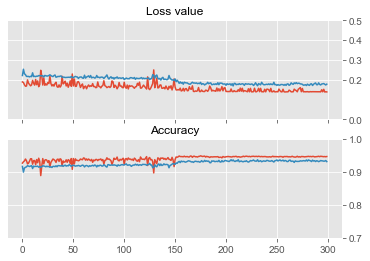

In [0]:
import pandas as pd

records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0, 0.20, 0.30, 0.4, 0.5])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records['val_acc'])
plt.plot(records['acc'])
plt.yticks([0.7, 0.8, 0.9, 1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

In [0]:
wrong_ans_index = []

for i in range(len(predout)):
    if predout[i] != testout[i]:
        wrong_ans_index.append(i)

In [0]:
wrong_ans_index = list(set(wrong_ans_index))

Showing 2560 index image
Predicted as 1 but is actually 0


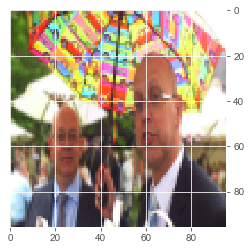

Showing 3585 index image
Predicted as 1 but is actually 0


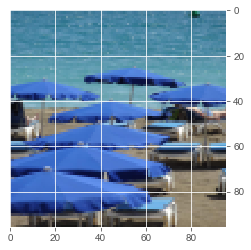

Showing 2051 index image
Predicted as 0 but is actually 1


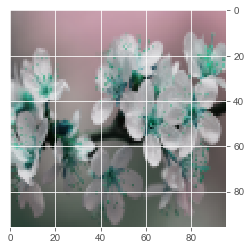

Showing 4 index image
Predicted as 0 but is actually 1


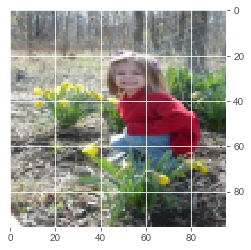

Showing 2053 index image
Predicted as 0 but is actually 1


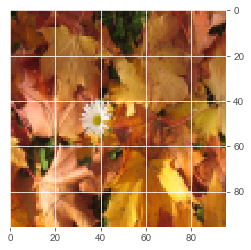

Showing 3076 index image
Predicted as 1 but is actually 0


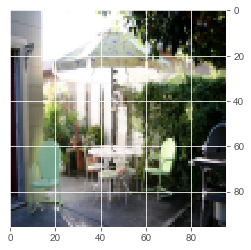

Showing 3079 index image
Predicted as 1 but is actually 0


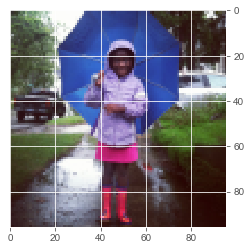

Showing 3588 index image
Predicted as 1 but is actually 0


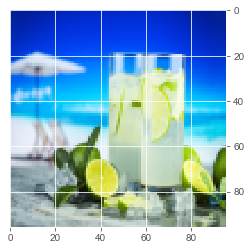

Showing 1547 index image
Predicted as 0 but is actually 1


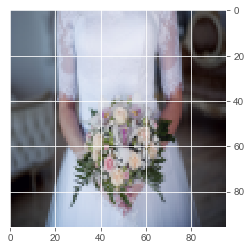

Showing 17 index image
Predicted as 0 but is actually 1


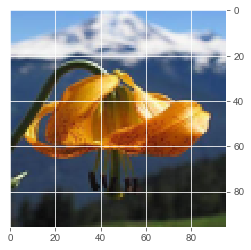

Showing 3603 index image
Predicted as 1 but is actually 0


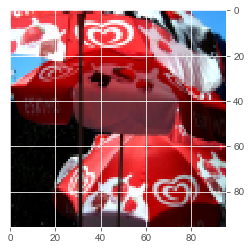

Showing 536 index image
Predicted as 0 but is actually 1


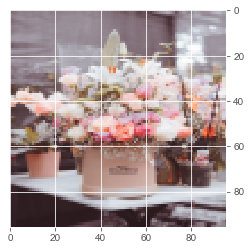

Showing 2584 index image
Predicted as 1 but is actually 0


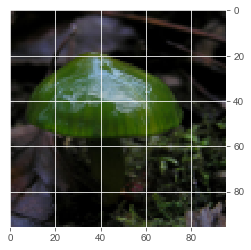

Showing 2585 index image
Predicted as 1 but is actually 0


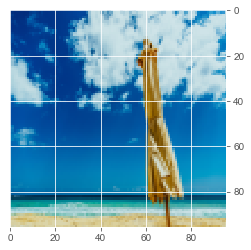

Showing 32 index image
Predicted as 0 but is actually 1


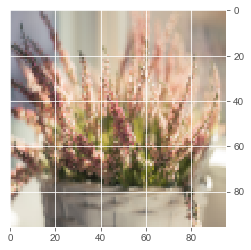

Showing 1572 index image
Predicted as 0 but is actually 1


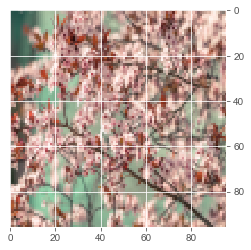

Showing 2610 index image
Predicted as 1 but is actually 0


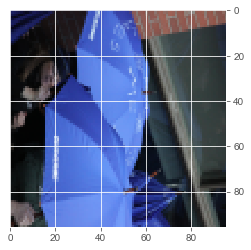

Showing 570 index image
Predicted as 0 but is actually 1


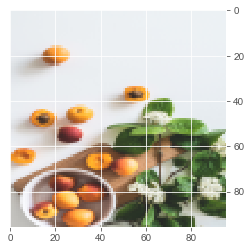

Showing 571 index image
Predicted as 0 but is actually 1


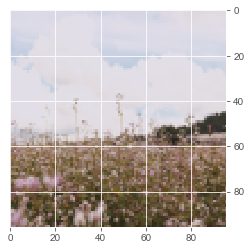

Showing 2111 index image
Predicted as 0 but is actually 1


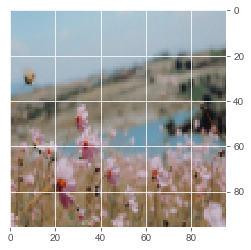

Showing 3136 index image
Predicted as 1 but is actually 0


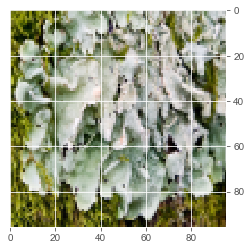

Showing 69 index image
Predicted as 0 but is actually 1


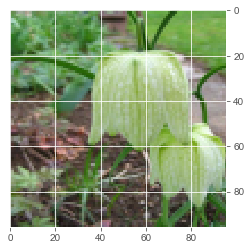

Showing 70 index image
Predicted as 0 but is actually 1


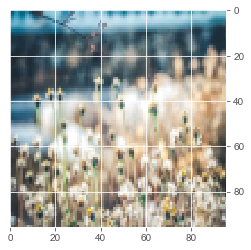

Showing 3141 index image
Predicted as 1 but is actually 0


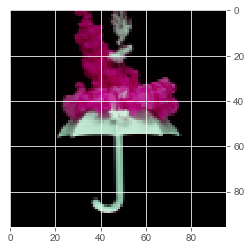

Showing 3656 index image
Predicted as 1 but is actually 0


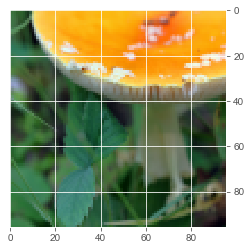

Showing 75 index image
Predicted as 0 but is actually 1


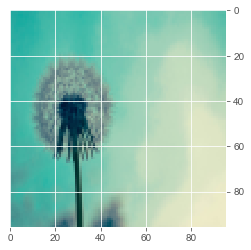

Showing 1616 index image
Predicted as 0 but is actually 1


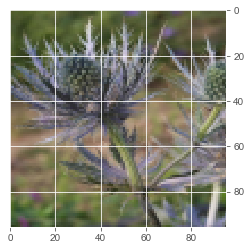

Showing 83 index image
Predicted as 0 but is actually 1


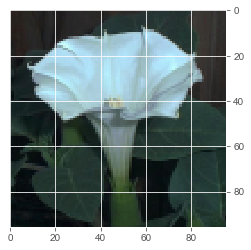

Showing 1619 index image
Predicted as 0 but is actually 1


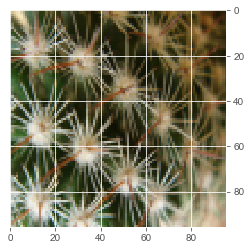

Showing 597 index image
Predicted as 0 but is actually 1


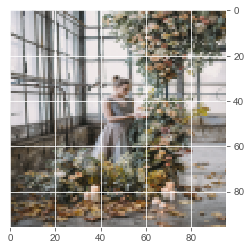

Showing 1109 index image
Predicted as 0 but is actually 1


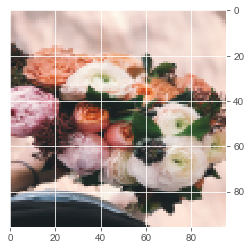

Showing 2132 index image
Predicted as 0 but is actually 1


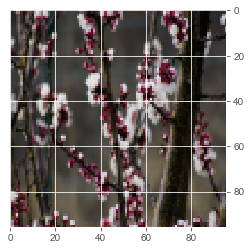

Showing 2648 index image
Predicted as 1 but is actually 0


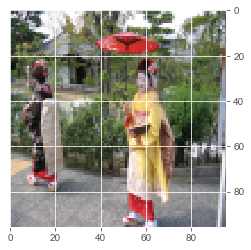

Showing 89 index image
Predicted as 0 but is actually 1


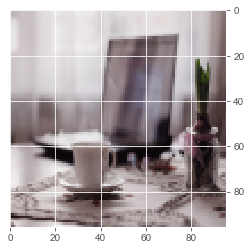

Showing 601 index image
Predicted as 0 but is actually 1


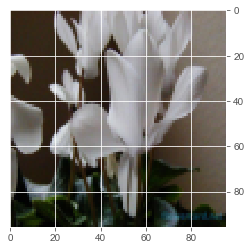

Showing 3155 index image
Predicted as 1 but is actually 0


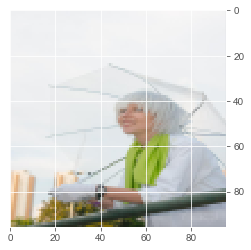

Showing 3668 index image
Predicted as 1 but is actually 0


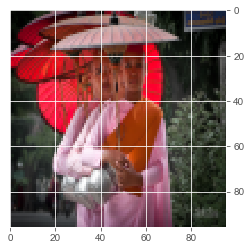

Showing 3671 index image
Predicted as 1 but is actually 0


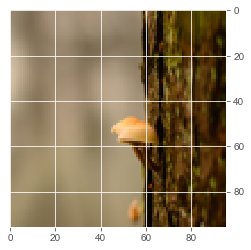

Showing 2656 index image
Predicted as 1 but is actually 0


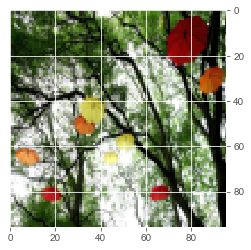

Showing 3680 index image
Predicted as 1 but is actually 0


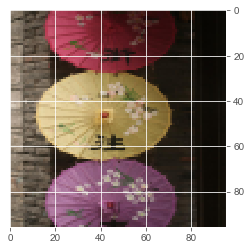

Showing 1642 index image
Predicted as 0 but is actually 1


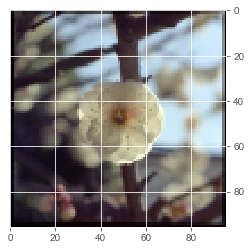

Showing 3183 index image
Predicted as 1 but is actually 0


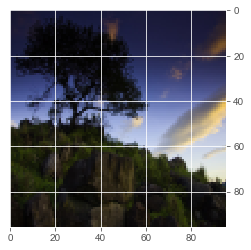

Showing 628 index image
Predicted as 0 but is actually 1


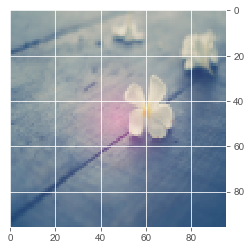

Showing 2164 index image
Predicted as 0 but is actually 1


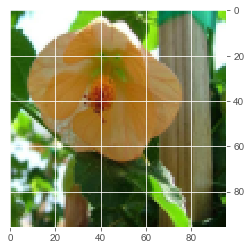

Showing 631 index image
Predicted as 0 but is actually 1


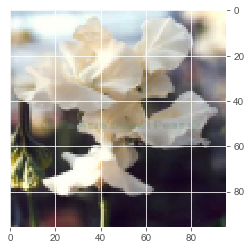

Showing 119 index image
Predicted as 0 but is actually 1


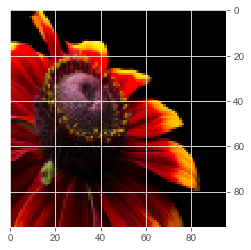

Showing 636 index image
Predicted as 0 but is actually 1


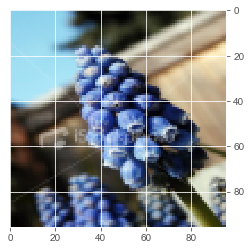

Showing 2176 index image
Predicted as 0 but is actually 1


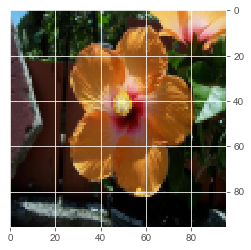

Showing 130 index image
Predicted as 0 but is actually 1


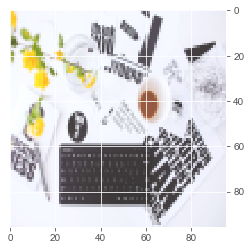

Showing 642 index image
Predicted as 0 but is actually 1


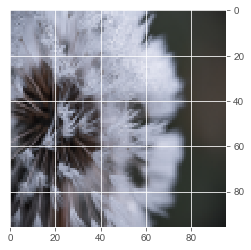

Showing 3203 index image
Predicted as 1 but is actually 0


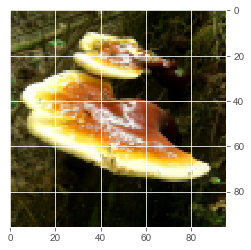

Showing 1669 index image
Predicted as 0 but is actually 1


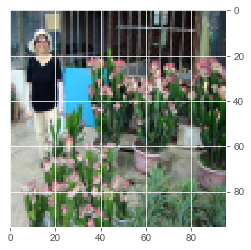

Showing 2181 index image
Predicted as 0 but is actually 1


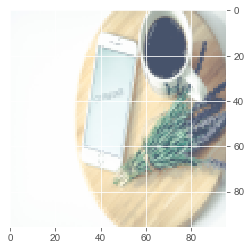

Showing 647 index image
Predicted as 0 but is actually 1


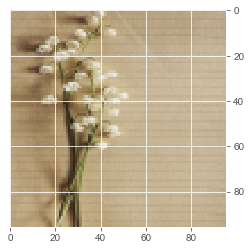

Showing 137 index image
Predicted as 0 but is actually 1


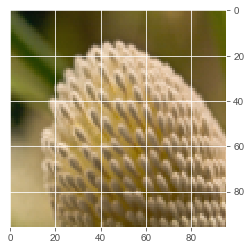

Showing 1164 index image
Predicted as 0 but is actually 1


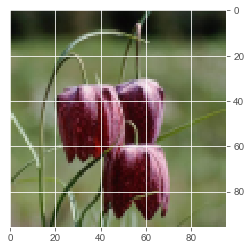

Showing 2189 index image
Predicted as 0 but is actually 1


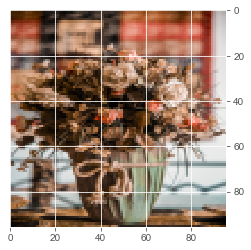

Showing 147 index image
Predicted as 0 but is actually 1


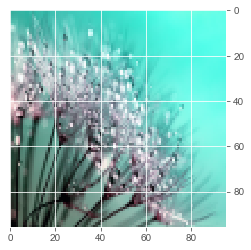

Showing 2195 index image
Predicted as 0 but is actually 1


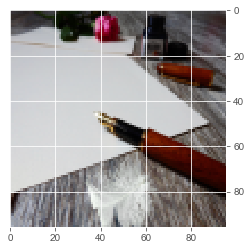

Showing 662 index image
Predicted as 0 but is actually 1


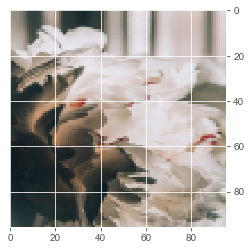

Showing 3224 index image
Predicted as 1 but is actually 0


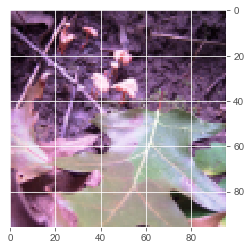

Showing 2713 index image
Predicted as 1 but is actually 0


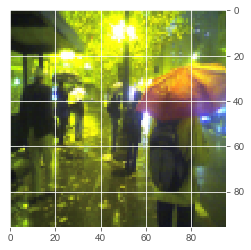

Showing 3226 index image
Predicted as 1 but is actually 0


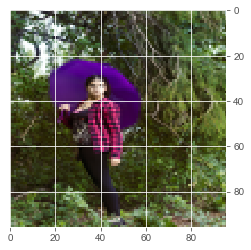

Showing 3233 index image
Predicted as 1 but is actually 0


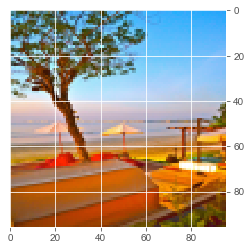

Showing 2210 index image
Predicted as 0 but is actually 1


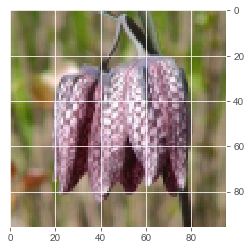

Showing 677 index image
Predicted as 0 but is actually 1


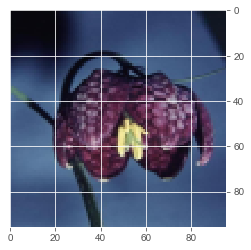

Showing 1704 index image
Predicted as 0 but is actually 1


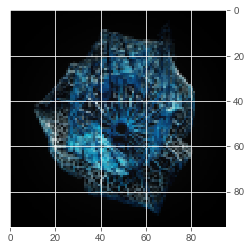

Showing 1706 index image
Predicted as 0 but is actually 1


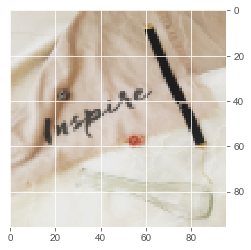

Showing 2221 index image
Predicted as 0 but is actually 1


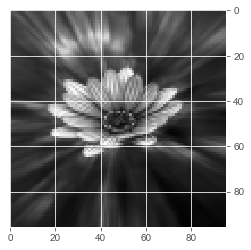

Showing 176 index image
Predicted as 0 but is actually 1


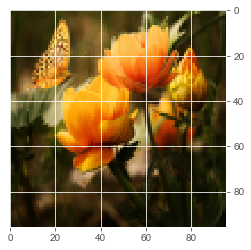

Showing 3254 index image
Predicted as 1 but is actually 0


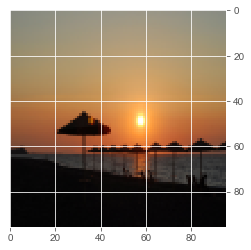

Showing 2743 index image
Predicted as 1 but is actually 0


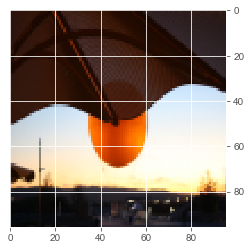

Showing 2749 index image
Predicted as 1 but is actually 0


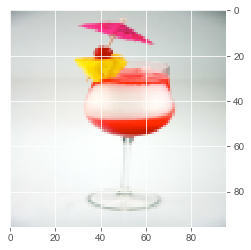

Showing 3266 index image
Predicted as 1 but is actually 0


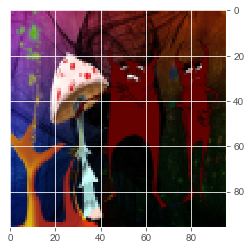

Showing 1220 index image
Predicted as 0 but is actually 1


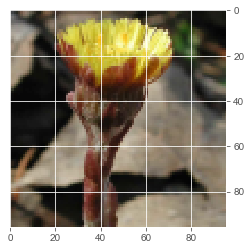

Showing 3268 index image
Predicted as 1 but is actually 0


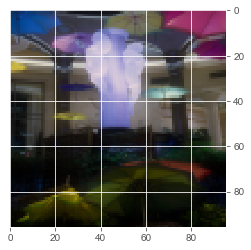

Showing 2249 index image
Predicted as 0 but is actually 1


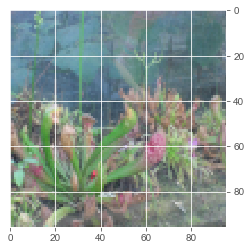

Showing 2763 index image
Predicted as 1 but is actually 0


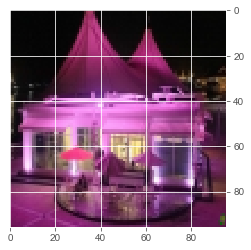

Showing 2770 index image
Predicted as 1 but is actually 0


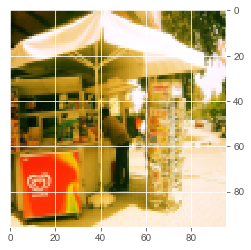

Showing 2261 index image
Predicted as 1 but is actually 0


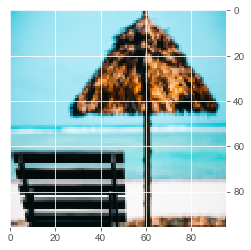

Showing 224 index image
Predicted as 0 but is actually 1


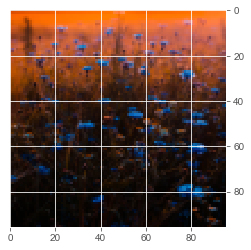

Showing 736 index image
Predicted as 0 but is actually 1


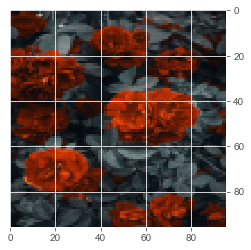

Showing 3297 index image
Predicted as 1 but is actually 0


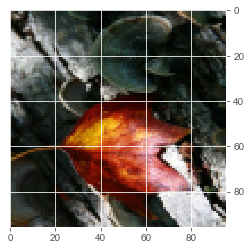

Showing 1259 index image
Predicted as 0 but is actually 1


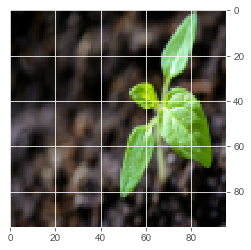

Showing 752 index image
Predicted as 0 but is actually 1


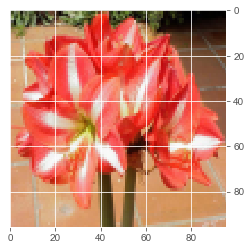

Showing 753 index image
Predicted as 0 but is actually 1


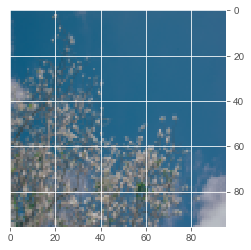

Showing 1264 index image
Predicted as 0 but is actually 1


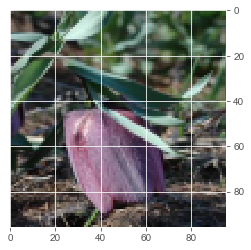

Showing 246 index image
Predicted as 0 but is actually 1


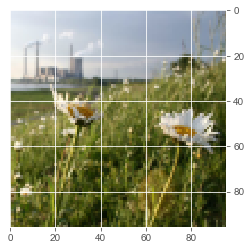

Showing 2297 index image
Predicted as 1 but is actually 0


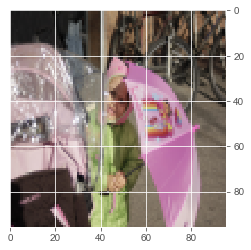

Showing 253 index image
Predicted as 0 but is actually 1


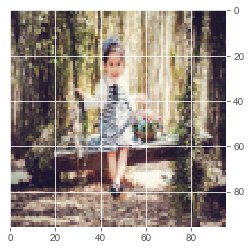

Showing 2302 index image
Predicted as 1 but is actually 0


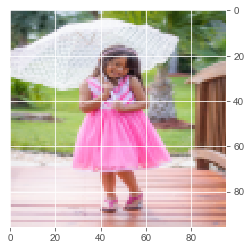

Showing 3326 index image
Predicted as 1 but is actually 0


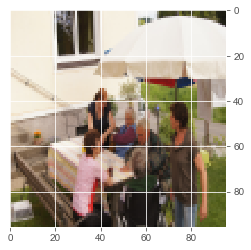

Showing 2309 index image
Predicted as 1 but is actually 0


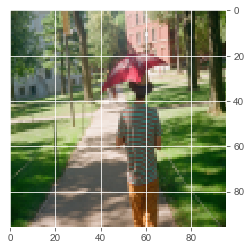

Showing 2821 index image
Predicted as 1 but is actually 0


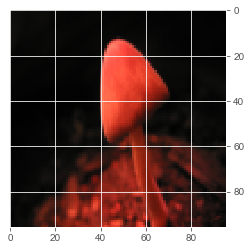

Showing 270 index image
Predicted as 0 but is actually 1


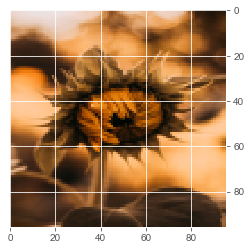

Showing 1807 index image
Predicted as 0 but is actually 1


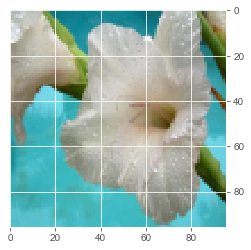

Showing 1808 index image
Predicted as 0 but is actually 1


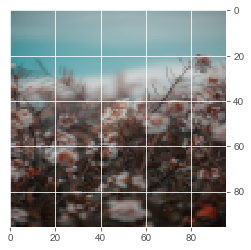

Showing 1298 index image
Predicted as 0 but is actually 1


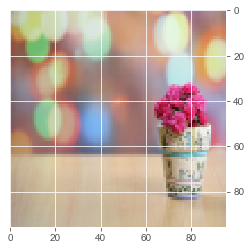

Showing 3347 index image
Predicted as 1 but is actually 0


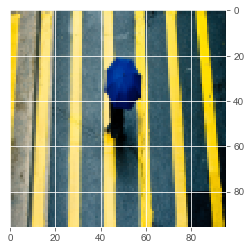

Showing 795 index image
Predicted as 0 but is actually 1


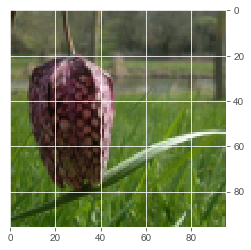

Showing 2331 index image
Predicted as 1 but is actually 0


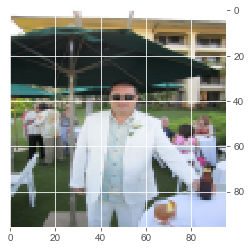

Showing 2337 index image
Predicted as 1 but is actually 0


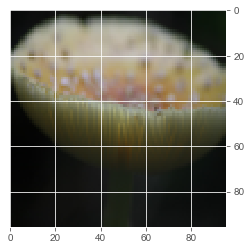

Showing 2343 index image
Predicted as 1 but is actually 0


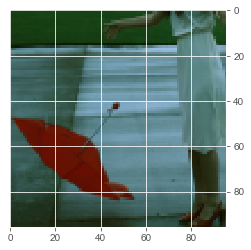

Showing 3367 index image
Predicted as 1 but is actually 0


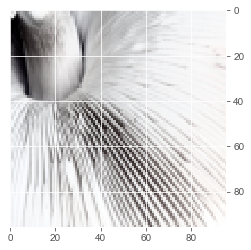

Showing 2858 index image
Predicted as 1 but is actually 0


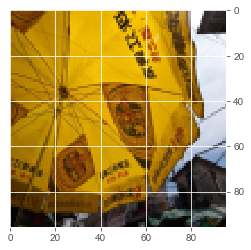

Showing 1836 index image
Predicted as 0 but is actually 1


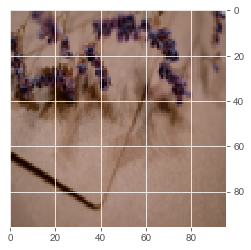

Showing 1325 index image
Predicted as 0 but is actually 1


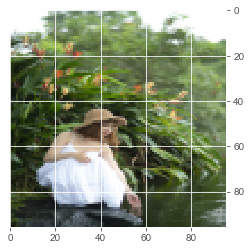

Showing 2864 index image
Predicted as 1 but is actually 0


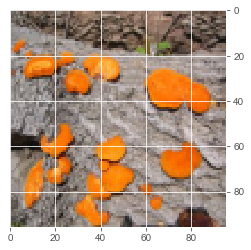

Showing 1329 index image
Predicted as 0 but is actually 1


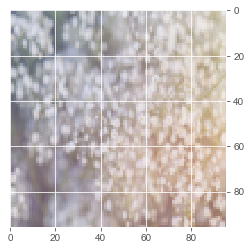

Showing 2355 index image
Predicted as 1 but is actually 0


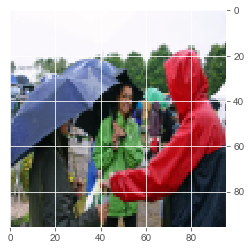

Showing 820 index image
Predicted as 0 but is actually 1


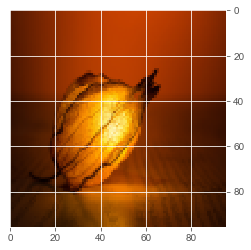

Showing 1845 index image
Predicted as 0 but is actually 1


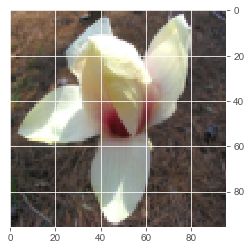

Showing 312 index image
Predicted as 0 but is actually 1


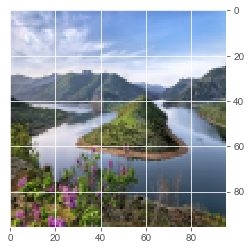

Showing 2360 index image
Predicted as 1 but is actually 0


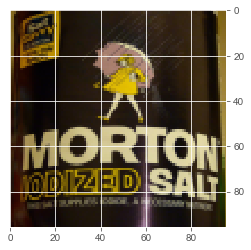

Showing 3384 index image
Predicted as 1 but is actually 0


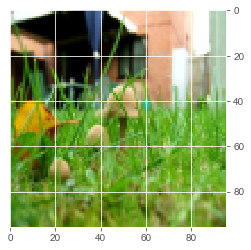

Showing 1854 index image
Predicted as 0 but is actually 1


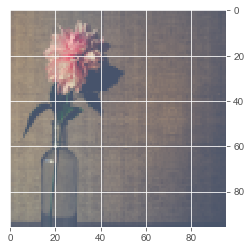

Showing 2375 index image
Predicted as 1 but is actually 0


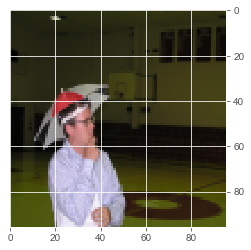

Showing 1868 index image
Predicted as 0 but is actually 1


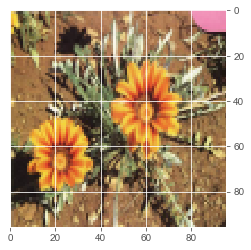

Showing 2390 index image
Predicted as 1 but is actually 0


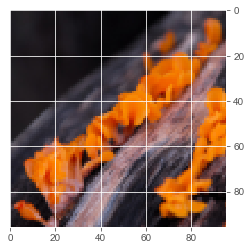

Showing 2903 index image
Predicted as 1 but is actually 0


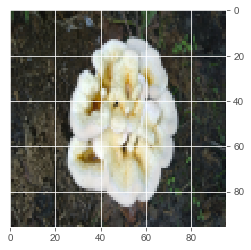

Showing 347 index image
Predicted as 0 but is actually 1


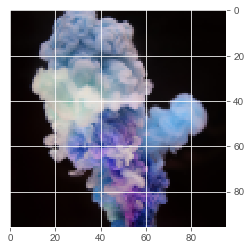

Showing 1371 index image
Predicted as 0 but is actually 1


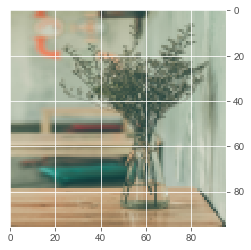

Showing 2909 index image
Predicted as 1 but is actually 0


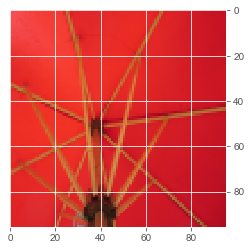

Showing 2398 index image
Predicted as 1 but is actually 0


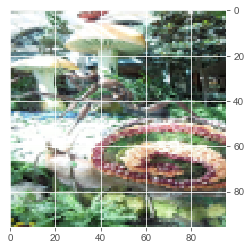

Showing 3419 index image
Predicted as 1 but is actually 0


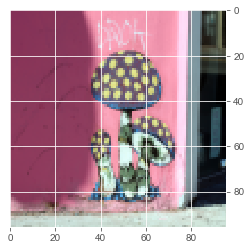

Showing 2400 index image
Predicted as 1 but is actually 0


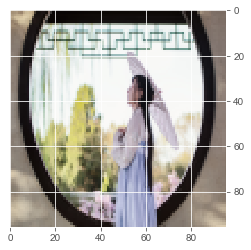

Showing 2914 index image
Predicted as 1 but is actually 0


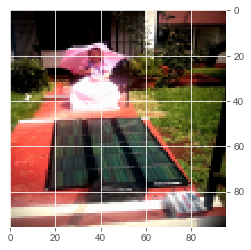

Showing 2916 index image
Predicted as 1 but is actually 0


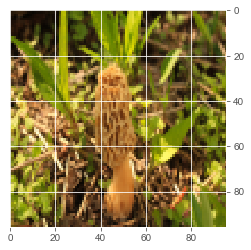

Showing 2405 index image
Predicted as 1 but is actually 0


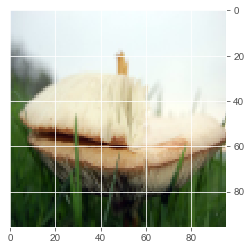

Showing 1382 index image
Predicted as 0 but is actually 1


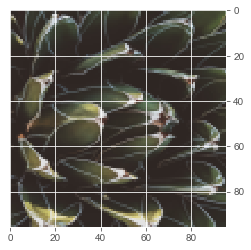

Showing 2407 index image
Predicted as 1 but is actually 0


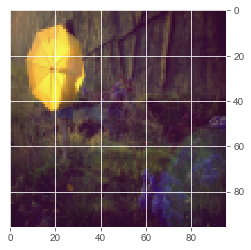

Showing 2921 index image
Predicted as 1 but is actually 0


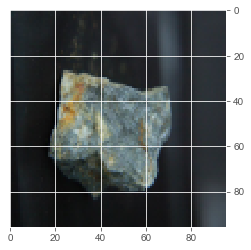

Showing 1902 index image
Predicted as 0 but is actually 1


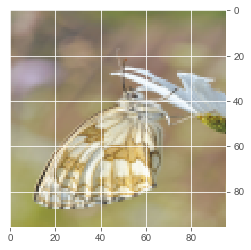

Showing 367 index image
Predicted as 0 but is actually 1


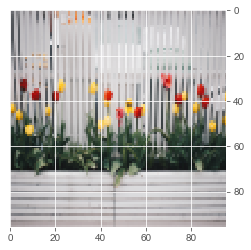

Showing 2929 index image
Predicted as 1 but is actually 0


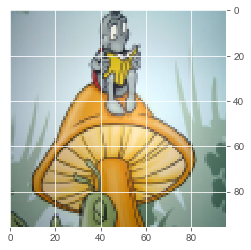

Showing 1397 index image
Predicted as 0 but is actually 1


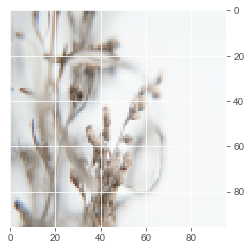

Showing 1398 index image
Predicted as 0 but is actually 1


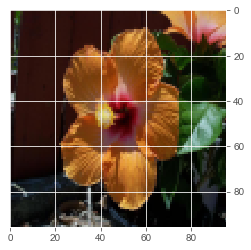

Showing 376 index image
Predicted as 0 but is actually 1


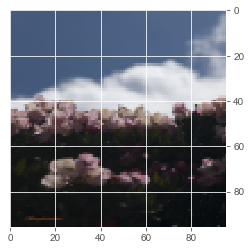

Showing 2425 index image
Predicted as 1 but is actually 0


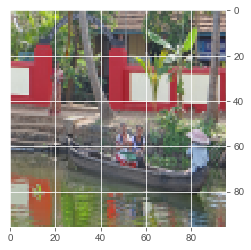

Showing 2426 index image
Predicted as 1 but is actually 0


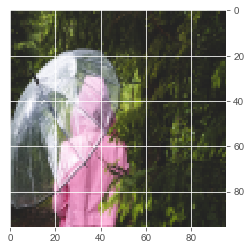

Showing 2430 index image
Predicted as 1 but is actually 0


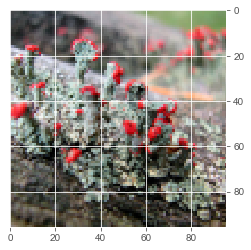

Showing 2947 index image
Predicted as 1 but is actually 0


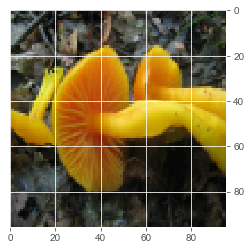

Showing 2436 index image
Predicted as 1 but is actually 0


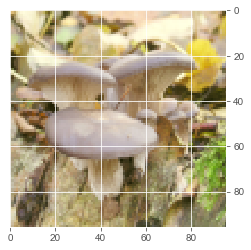

Showing 390 index image
Predicted as 0 but is actually 1


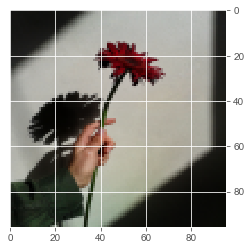

Showing 2441 index image
Predicted as 1 but is actually 0


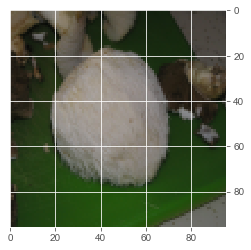

Showing 2442 index image
Predicted as 1 but is actually 0


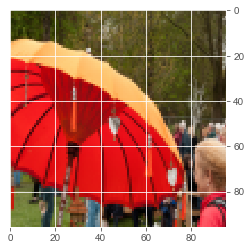

Showing 2444 index image
Predicted as 1 but is actually 0


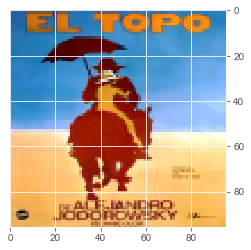

Showing 910 index image
Predicted as 0 but is actually 1


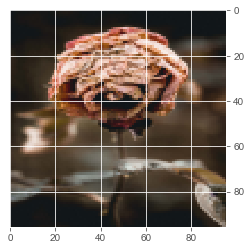

Showing 1424 index image
Predicted as 0 but is actually 1


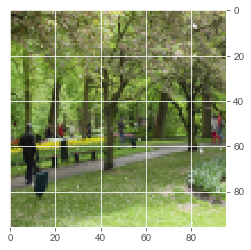

Showing 1426 index image
Predicted as 0 but is actually 1


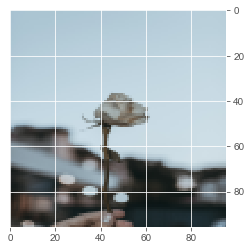

Showing 3480 index image
Predicted as 1 but is actually 0


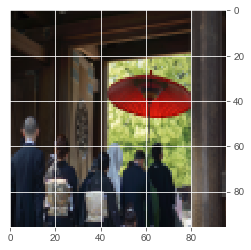

Showing 1945 index image
Predicted as 0 but is actually 1


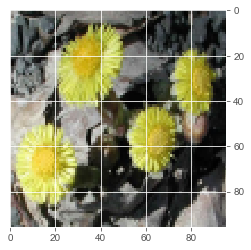

Showing 416 index image
Predicted as 0 but is actually 1


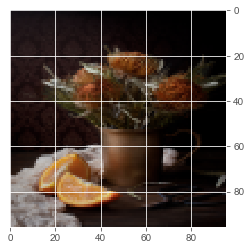

Showing 3493 index image
Predicted as 1 but is actually 0


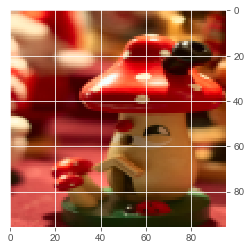

Showing 1963 index image
Predicted as 0 but is actually 1


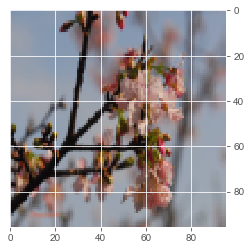

Showing 1454 index image
Predicted as 0 but is actually 1


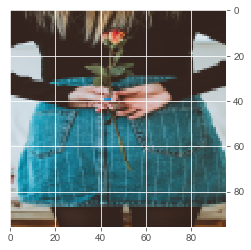

Showing 1967 index image
Predicted as 0 but is actually 1


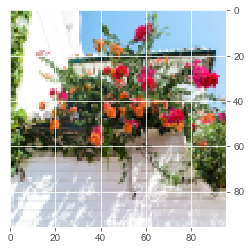

Showing 433 index image
Predicted as 0 but is actually 1


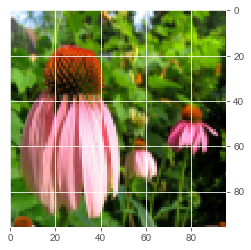

Showing 2482 index image
Predicted as 1 but is actually 0


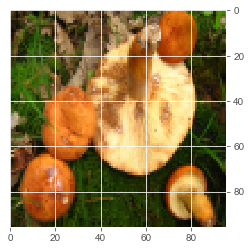

Showing 2997 index image
Predicted as 1 but is actually 0


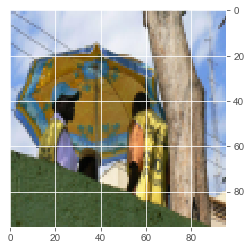

Showing 951 index image
Predicted as 0 but is actually 1


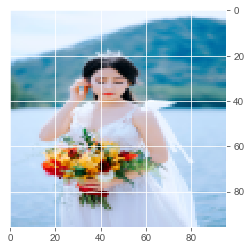

Showing 440 index image
Predicted as 0 but is actually 1


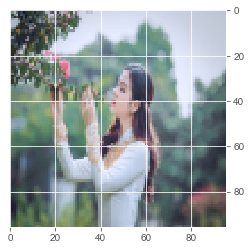

Showing 1466 index image
Predicted as 0 but is actually 1


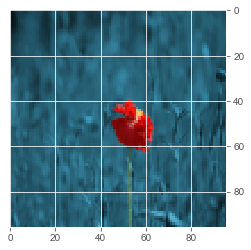

Showing 1978 index image
Predicted as 0 but is actually 1


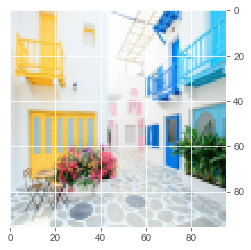

Showing 1981 index image
Predicted as 0 but is actually 1


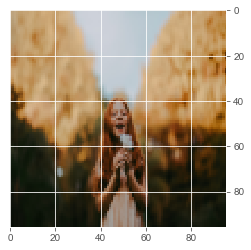

Showing 958 index image
Predicted as 0 but is actually 1


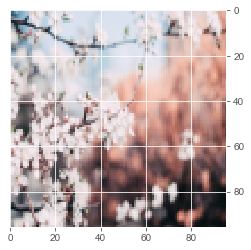

Showing 1470 index image
Predicted as 0 but is actually 1


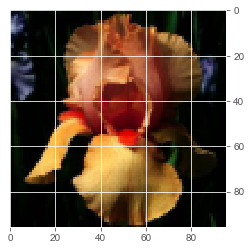

Showing 3521 index image
Predicted as 1 but is actually 0


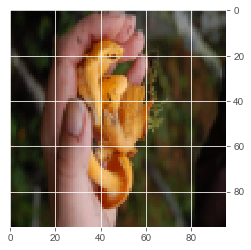

Showing 962 index image
Predicted as 0 but is actually 1


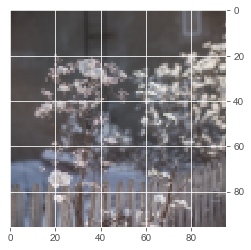

Showing 2498 index image
Predicted as 1 but is actually 0


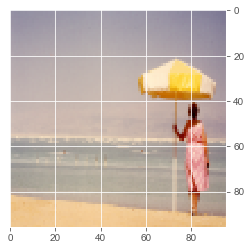

Showing 1988 index image
Predicted as 0 but is actually 1


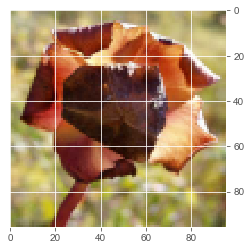

Showing 2505 index image
Predicted as 1 but is actually 0


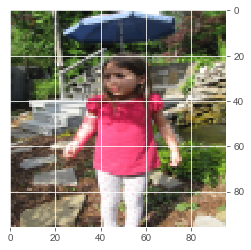

Showing 3017 index image
Predicted as 1 but is actually 0


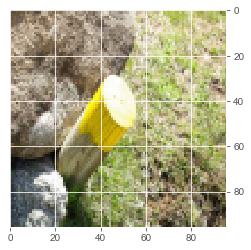

Showing 3028 index image
Predicted as 1 but is actually 0


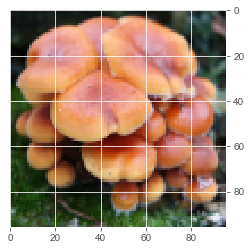

Showing 1493 index image
Predicted as 0 but is actually 1


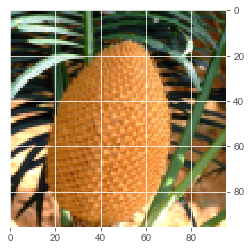

Showing 3542 index image
Predicted as 1 but is actually 0


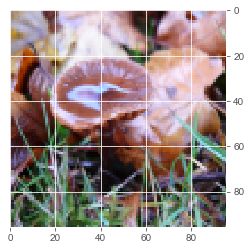

Showing 3033 index image
Predicted as 1 but is actually 0


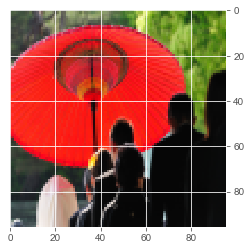

Showing 986 index image
Predicted as 0 but is actually 1


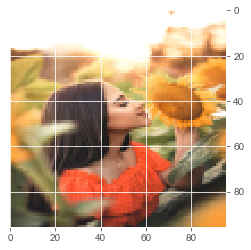

Showing 2526 index image
Predicted as 1 but is actually 0


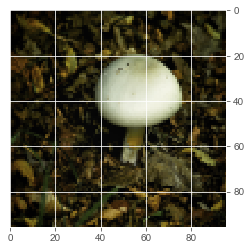

Showing 2528 index image
Predicted as 1 but is actually 0


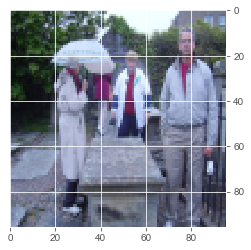

Showing 3044 index image
Predicted as 1 but is actually 0


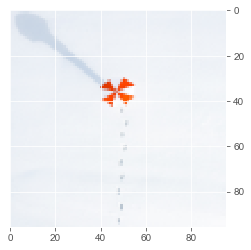

Showing 2534 index image
Predicted as 1 but is actually 0


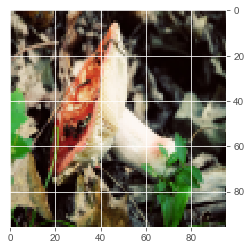

Showing 2025 index image
Predicted as 0 but is actually 1


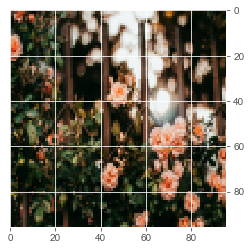

Showing 1517 index image
Predicted as 0 but is actually 1


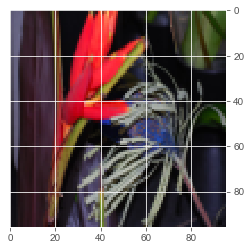

Showing 2029 index image
Predicted as 0 but is actually 1


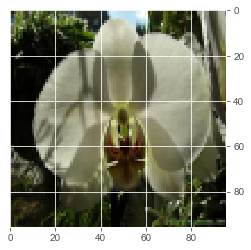

Showing 3571 index image
Predicted as 1 but is actually 0


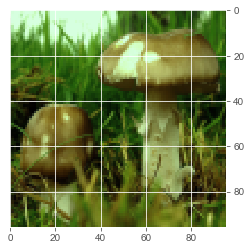

Showing 3062 index image
Predicted as 1 but is actually 0


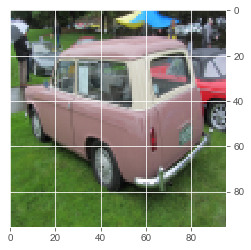

Showing 1020 index image
Predicted as 0 but is actually 1


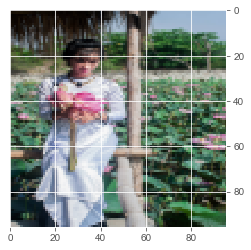

Showing 1022 index image
Predicted as 0 but is actually 1


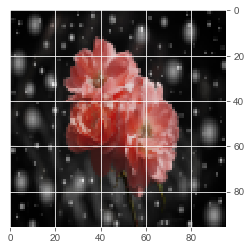

In [0]:
# Randomly show X examples of that was wrong

dataset = tsDatOrg #flowers #fungus #rocks

for index in wrong_ans_index:
    #index = wrong_ans_index[random.randint(0, len(wrong_ans_index)-1)]
    print("Showing %s index image" %(index))
    print("Predicted as %s but is actually %s" %(predout[index], testout[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

# Stacking 3 NNs?

In [0]:
modelGo1     = create_inception_v4() # This is used for final testing
modelGo1.load_weights("FlowerPower_InceptionV4best9470.hdf5")
modelGo1.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])

modelGo2     = create_inception_resnet_v2() # This is used for final testing
modelGo2.load_weights("FlowerPower_InceptionResNetV2best9521.hdf5")
modelGo2.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])

modelGo3     = create_se_inception_resnet_v2() # This is used for final testing
modelGo3.load_weights("FlowerPower_SEInceptionResNetV2best9489.hdf5")
modelGo3.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])


In [0]:
predicts1    = modelGo1.predict(tsDat)
predicts2    = modelGo2.predict(tsDat)
predicts3    = modelGo3.predict(tsDat)

In [0]:
predicts_ave = []
weights = [0.33, 0.33, 0.33]

for i in range(len(predicts1)):
    ave0 = predicts1[i][0]*weights[0] + predicts2[i][0]*weights[1] + predicts3[i][0]*weights[2]
    ave1 = predicts1[i][1]*weights[0] + predicts2[i][1]*weights[1] + predicts3[i][1]*weights[2]
    predicts_ave.append([ave0, ave1])

In [0]:
predicts_ave = np.array(predicts_ave)

In [0]:
# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts_ave,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['non-flower', 'flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 95.73%
              precision    recall  f1-score   support

  non-flower     0.9322    0.9606    0.9462      1446
      flower     0.9742    0.9551    0.9645      2250

    accuracy                         0.9573      3696
   macro avg     0.9532    0.9578    0.9554      3696
weighted avg     0.9578    0.9573    0.9574      3696

[[1389   57]
 [ 101 2149]]


In [0]:
predicts_ave = []
weights = [0.30, 0.40, 0.30]

for i in range(len(predicts1)):
    ave0 = predicts1[i][0]*weights[0] + predicts2[i][0]*weights[1] + predicts3[i][0]*weights[2]
    ave1 = predicts1[i][1]*weights[0] + predicts2[i][1]*weights[1] + predicts3[i][1]*weights[2]
    predicts_ave.append([ave0, ave1])

predicts_ave = np.array(predicts_ave)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts_ave,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['non-flower', 'flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 95.73%
              precision    recall  f1-score   support

  non-flower     0.9305    0.9627    0.9463      1446
      flower     0.9755    0.9538    0.9645      2250

    accuracy                         0.9573      3696
   macro avg     0.9530    0.9582    0.9554      3696
weighted avg     0.9579    0.9573    0.9574      3696

[[1392   54]
 [ 104 2146]]


In [0]:
weights_all = []
for i in np.linspace(0, 0.5, 21):
    for j in np.linspace(0, 0.5, 21):
        weights_all.append([float(round(i,4)), float(round(j,4)), float(round(1-i-j,4))])

In [0]:
for weights in weights_all:
    print(weights)
    
    predicts_ave = []
    for i in range(len(predicts1)):
        ave0 = predicts1[i][0]*weights[0] + predicts2[i][0]*weights[1] + predicts3[i][0]*weights[2]
        ave1 = predicts1[i][1]*weights[0] + predicts2[i][1]*weights[1] + predicts3[i][1]*weights[2]
        predicts_ave.append([ave0, ave1])

    predicts_ave = np.array(predicts_ave)

    # Prepare the classification output
    # for the classification report
    predout     = np.argmax(predicts_ave,axis=1)
    testout     = np.argmax(tsLbl,axis=1)
    labelname   = ['non-flower', 'flower']
                                                # the labels for the classfication report


    testScores  = metrics.accuracy_score(testout,predout)
    confusion   = metrics.confusion_matrix(testout,predout)


    print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
    print("\n")

[0.0, 0.0, 1.0]
Best accuracy (on testing dataset): 94.89%


[0.0, 0.025, 0.975]
Best accuracy (on testing dataset): 94.94%


[0.0, 0.05, 0.95]
Best accuracy (on testing dataset): 94.99%


[0.0, 0.075, 0.925]
Best accuracy (on testing dataset): 95.02%


[0.0, 0.1, 0.9]
Best accuracy (on testing dataset): 95.05%


[0.0, 0.125, 0.875]
Best accuracy (on testing dataset): 95.13%


[0.0, 0.15, 0.85]
Best accuracy (on testing dataset): 95.10%


[0.0, 0.175, 0.825]
Best accuracy (on testing dataset): 95.18%


[0.0, 0.2, 0.8]
Best accuracy (on testing dataset): 95.21%


[0.0, 0.225, 0.775]
Best accuracy (on testing dataset): 95.16%


[0.0, 0.25, 0.75]
Best accuracy (on testing dataset): 95.16%


[0.0, 0.275, 0.725]
Best accuracy (on testing dataset): 95.16%


[0.0, 0.3, 0.7]
Best accuracy (on testing dataset): 95.18%


[0.0, 0.325, 0.675]
Best accuracy (on testing dataset): 95.24%


[0.0, 0.35, 0.65]
Best accuracy (on testing dataset): 95.24%


[0.0, 0.375, 0.625]
Best accuracy (on testing dat

Best accuracy (on testing dataset): 95.10%


[0.15, 0.05, 0.8]
Best accuracy (on testing dataset): 95.18%


[0.15, 0.075, 0.775]
Best accuracy (on testing dataset): 95.32%


[0.15, 0.1, 0.75]
Best accuracy (on testing dataset): 95.37%


[0.15, 0.125, 0.725]
Best accuracy (on testing dataset): 95.37%


[0.15, 0.15, 0.7]
Best accuracy (on testing dataset): 95.43%


[0.15, 0.175, 0.675]
Best accuracy (on testing dataset): 95.40%


[0.15, 0.2, 0.65]
Best accuracy (on testing dataset): 95.43%


[0.15, 0.225, 0.625]
Best accuracy (on testing dataset): 95.43%


[0.15, 0.25, 0.6]
Best accuracy (on testing dataset): 95.48%


[0.15, 0.275, 0.575]
Best accuracy (on testing dataset): 95.54%


[0.15, 0.3, 0.55]
Best accuracy (on testing dataset): 95.54%


[0.15, 0.325, 0.525]
Best accuracy (on testing dataset): 95.70%


[0.15, 0.35, 0.5]
Best accuracy (on testing dataset): 95.62%


[0.15, 0.375, 0.475]
Best accuracy (on testing dataset): 95.56%


[0.15, 0.4, 0.45]
Best accuracy (on testing dataset)

Best accuracy (on testing dataset): 95.64%


[0.3, 0.175, 0.525]
Best accuracy (on testing dataset): 95.67%


[0.3, 0.2, 0.5]
Best accuracy (on testing dataset): 95.73%


[0.3, 0.225, 0.475]
Best accuracy (on testing dataset): 95.73%


[0.3, 0.25, 0.45]
Best accuracy (on testing dataset): 95.70%


[0.3, 0.275, 0.425]
Best accuracy (on testing dataset): 95.73%


[0.3, 0.3, 0.4]
Best accuracy (on testing dataset): 95.67%


[0.3, 0.325, 0.375]
Best accuracy (on testing dataset): 95.70%


[0.3, 0.35, 0.35]
Best accuracy (on testing dataset): 95.75%


[0.3, 0.375, 0.325]
Best accuracy (on testing dataset): 95.70%


[0.3, 0.4, 0.3]
Best accuracy (on testing dataset): 95.73%


[0.3, 0.425, 0.275]
Best accuracy (on testing dataset): 95.75%


[0.3, 0.45, 0.25]
Best accuracy (on testing dataset): 95.75%


[0.3, 0.475, 0.225]
Best accuracy (on testing dataset): 95.67%


[0.3, 0.5, 0.2]
Best accuracy (on testing dataset): 95.67%


[0.325, 0.0, 0.675]
Best accuracy (on testing dataset): 95.37%


[0

Best accuracy (on testing dataset): 95.67%


[0.45, 0.25, 0.3]
Best accuracy (on testing dataset): 95.73%


[0.45, 0.275, 0.275]
Best accuracy (on testing dataset): 95.73%


[0.45, 0.3, 0.25]
Best accuracy (on testing dataset): 95.70%


[0.45, 0.325, 0.225]
Best accuracy (on testing dataset): 95.64%


[0.45, 0.35, 0.2]
Best accuracy (on testing dataset): 95.64%


[0.45, 0.375, 0.175]
Best accuracy (on testing dataset): 95.64%


[0.45, 0.4, 0.15]
Best accuracy (on testing dataset): 95.64%


[0.45, 0.425, 0.125]
Best accuracy (on testing dataset): 95.67%


[0.45, 0.45, 0.1]
Best accuracy (on testing dataset): 95.59%


[0.45, 0.475, 0.075]
Best accuracy (on testing dataset): 95.54%


[0.45, 0.5, 0.05]
Best accuracy (on testing dataset): 95.51%


[0.475, 0.0, 0.525]
Best accuracy (on testing dataset): 95.43%


[0.475, 0.025, 0.5]
Best accuracy (on testing dataset): 95.62%


[0.475, 0.05, 0.475]
Best accuracy (on testing dataset): 95.73%


[0.475, 0.075, 0.45]
Best accuracy (on testing data

In [0]:
# Best accuracy is obtained with the following weights:

# [0.35, 0.375, 0.275]
# Best accuracy (on testing dataset): 95.86%

In [0]:
predicts_ave = []
weights = [0.35, 0.375, 0.275]

for i in range(len(predicts1)):
    ave0 = predicts1[i][0]*weights[0] + predicts2[i][0]*weights[1] + predicts3[i][0]*weights[2]
    ave1 = predicts1[i][1]*weights[0] + predicts2[i][1]*weights[1] + predicts3[i][1]*weights[2]
    predicts_ave.append([ave0, ave1])

predicts_ave = np.array(predicts_ave)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts_ave,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['non-flower', 'flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 95.86%
              precision    recall  f1-score   support

  non-flower     0.9336    0.9627    0.9479      1446
      flower     0.9755    0.9560    0.9657      2250

    accuracy                         0.9586      3696
   macro avg     0.9546    0.9593    0.9568      3696
weighted avg     0.9591    0.9586    0.9587      3696

[[1392   54]
 [  99 2151]]
